In [6]:
import pandas as pd
data = pd.read_csv(r"./final.csv")
data=data.drop_duplicates()
data

,Y,X,codigoparc,subregion,nombrefinc,especie,nombretecn,tipopropie,elevacionf,clasetextu,...,IMADAP(cm),Alturatotal(m),IMAAlt.(m),Alt.Dom.(m),ind.Sitio(m),AreaBasal(m2/Ha),ICAAB(m2/Ha),Vol.Tot.(m3/ha),IMA VT(m3/haporaño),ICAVT(m3/Ha)
0,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.7,5.1,0.8,7.2,--,10.5,0.0,27.5,4.1,--
1,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.8,6.6,0.8,9,--,17.5,4.4,57.3,6.9,18.8
2,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.9,9,1,12.6,--,23.4,5.9,99.7,10.7,42.5
3,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.8,10.4,1,13.6,--,24.5,1.0,120.9,11.7,21.2
4,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.7,11.1,1,14.2,--,25.1,0.7,134,11.9,14.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2382,14.294390,-90.254259,I42-1-2,IV-2 Santa Rosa,Teyca,NaN,Pinus oocarpa Schiede ex Schltdl,0=no hay informacion,1100,Franca o Franca-Arcillosa,...,1.7,17.7,1.2,20.3,24.9,31.5,2.7,255.4,17.5,22.5
2383,14.154415,-90.612766,I42-13-1,IV-2 Santa Rosa,Finca Maria Teresa,NaN,Tabebuia donnell-smithii Rose,6=industria privada,142,Franco-Arenosa Fina,...,1.4,13,1.2,19,--,19.4,0.0,129.8,12,--
2384,14.154415,-90.612766,I42-13-1,IV-2 Santa Rosa,Finca Maria Teresa,NaN,Tabebuia donnell-smithii Rose,6=industria privada,142,Franco-Arenosa Fina,...,1.4,15,1.1,21.2,--,18.7,-0.3,138.5,10.5,3.6
2385,14.101560,-90.341782,I42-4-3,IV-2 Santa Rosa,Los Cucuyos,NaN,Tectona grandis L. f.,0=no hay informacion,400,Franco-Arcillosa,...,0.9,9.4,0.6,15.3,--,16.3,0.0,101.3,6.4,--


In [7]:
#data.to_csv("./final.csv",index=False)

## filter down to one specie(the highest mean basal area) for each site,

In [8]:
unique_species_counts = data.groupby('codigoparc')['Especie'].nunique()
single_species_data = data[data['codigoparc'].isin(unique_species_counts[unique_species_counts == 1].index)]
multi_species_data = data[data['codigoparc'].isin(unique_species_counts[unique_species_counts > 1].index)]

filtered_data_list = []

for codigoparc, group in multi_species_data.groupby('codigoparc'):
    non_mixtas_data = group[~group['Especie'].str.contains('MIXTAS*')]
    
    mean_area_values = non_mixtas_data.groupby('Especie')['AreaBasal(m2/Ha)'].mean()
    top_especie = mean_area_values.idxmax()
    
    top_especie_data = non_mixtas_data[non_mixtas_data['Especie'] == top_especie]
    if top_especie_data['AreaBasal(m2/Ha)'].max() >= 5:
        filtered_data_list.append(top_especie_data)

data = pd.concat([single_species_data] + filtered_data_list)
data.head()

,Y,X,codigoparc,subregion,nombrefinc,especie,nombretecn,tipopropie,elevacionf,clasetextu,...,IMADAP(cm),Alturatotal(m),IMAAlt.(m),Alt.Dom.(m),ind.Sitio(m),AreaBasal(m2/Ha),ICAAB(m2/Ha),Vol.Tot.(m3/ha),IMA VT(m3/haporaño),ICAVT(m3/Ha)
0,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.7,5.1,0.8,7.2,--,10.5,0.0,27.5,4.1,--
1,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.8,6.6,0.8,9,--,17.5,4.4,57.3,6.9,18.8
2,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.9,9,1,12.6,--,23.4,5.9,99.7,10.7,42.5
3,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.8,10.4,1,13.6,--,24.5,1.0,120.9,11.7,21.2
4,14.021566,-90.053985,I40-4-1,IV Jutiapa,Miramar,PINUOO,Pinus oocarpa Schiede ex Schltdl,1=individual,1000,Franco-Arcillosa a Arcilla,...,1.7,11.1,1,14.2,--,25.1,0.7,134,11.9,14.3


## fitt curve for each site, report the site name, k value, only specie and coordinates to a csv

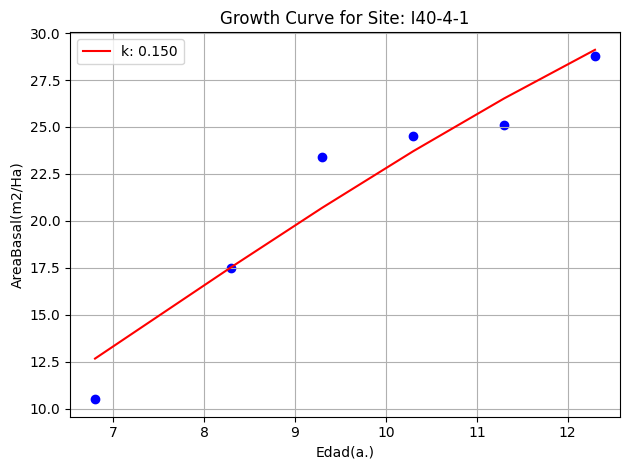

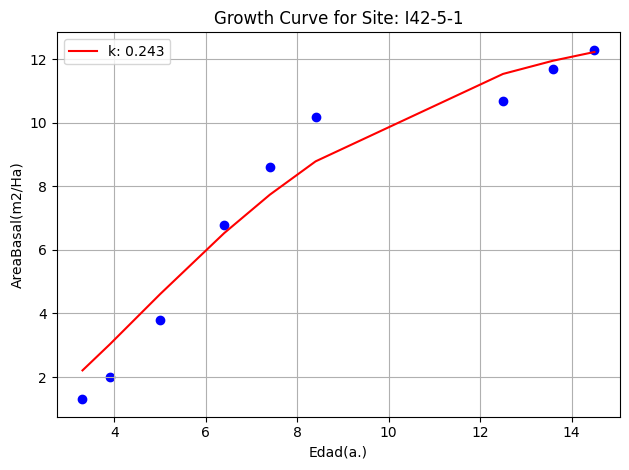

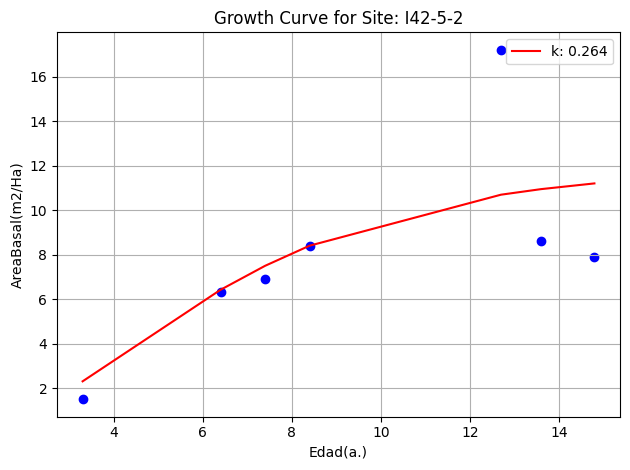

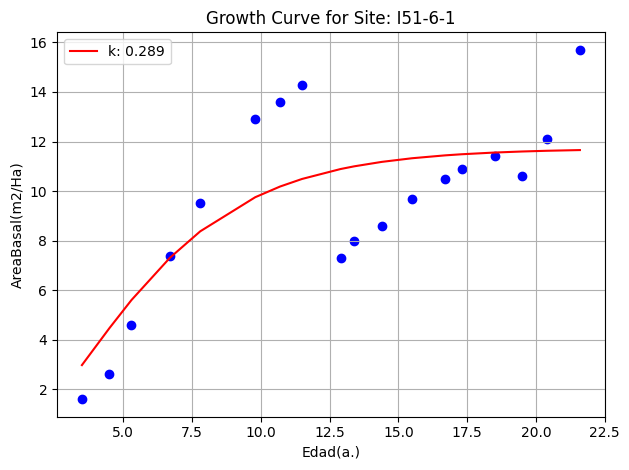

C:\Users\dinol\AppData\Local\Temp\ipykernel_6128\1124422173.py:15: RuntimeWarning: overflow encountered in exp
  return A * (1 - b * np.exp(-k * t))**(1 / (1 - m))
C:\Users\dinol\AppData\Local\Temp\ipykernel_6128\1124422173.py:15: RuntimeWarning: invalid value encountered in power
  return A * (1 - b * np.exp(-k * t))**(1 / (1 - m))


Failed to fit curve for site I51-9-1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


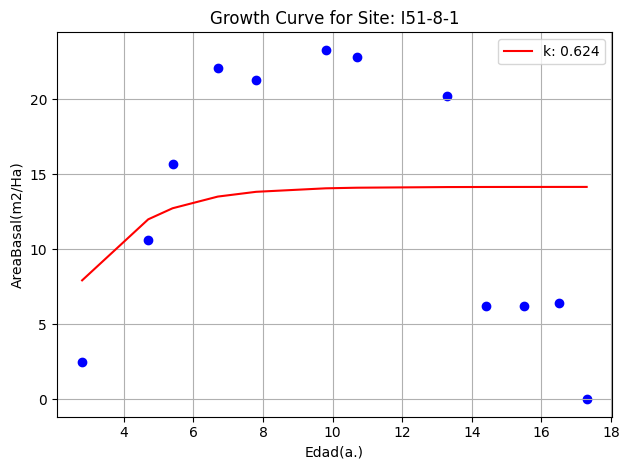

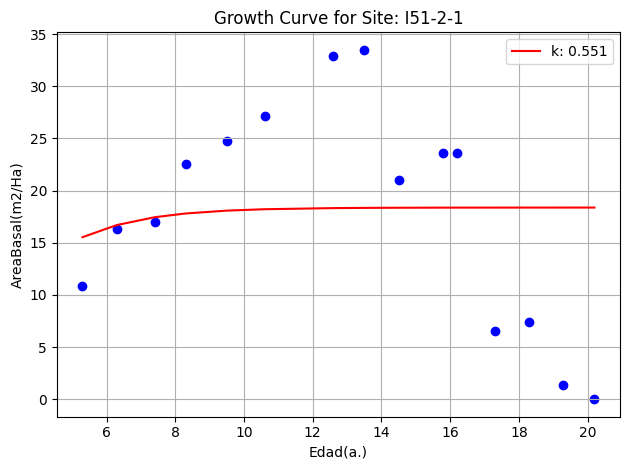

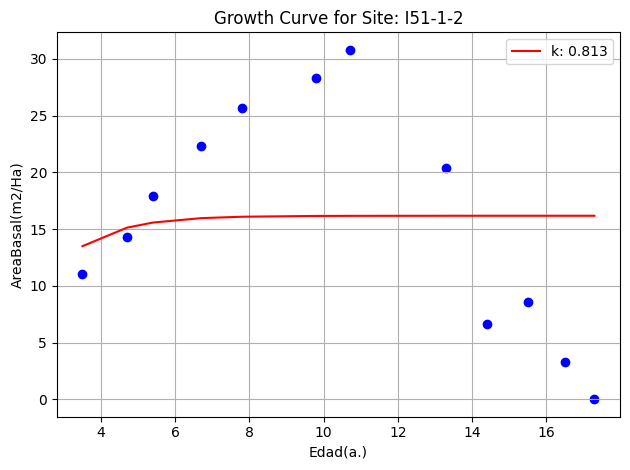

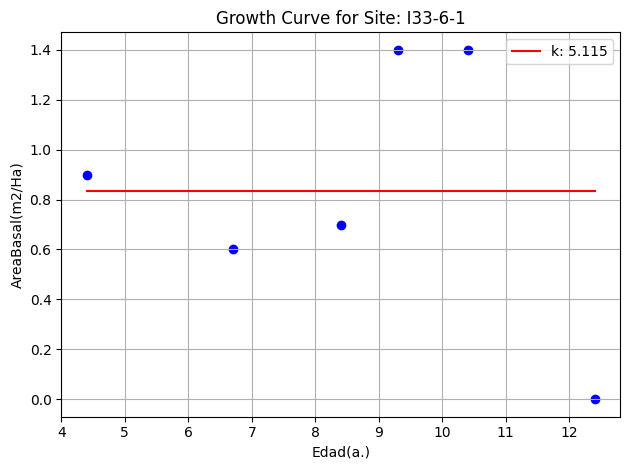

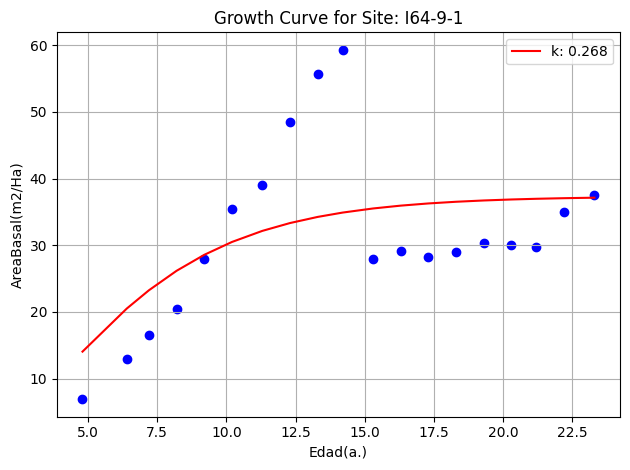

...

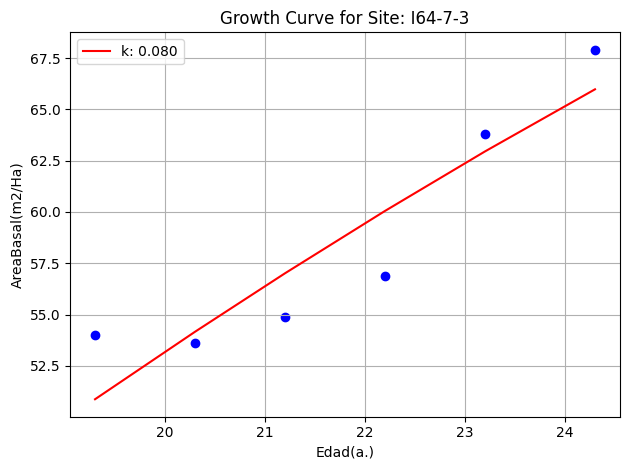

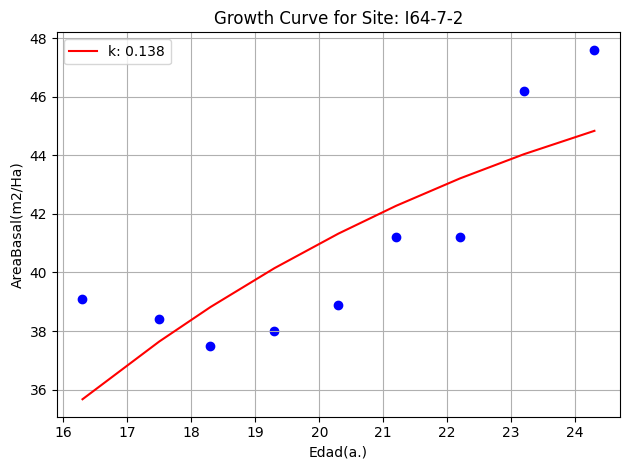

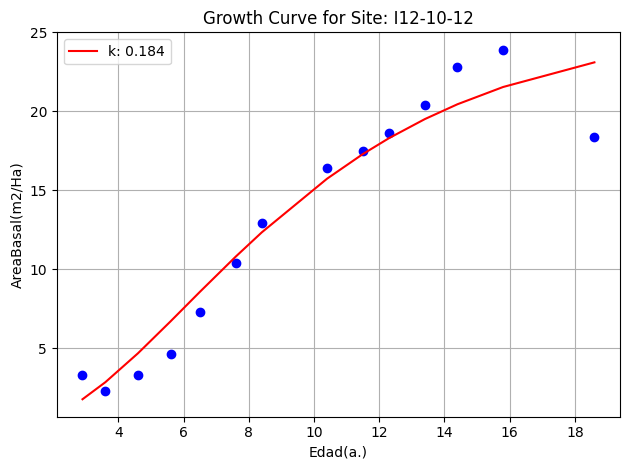

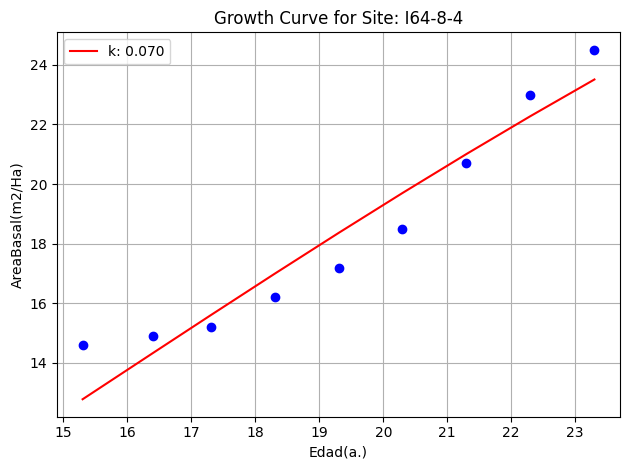

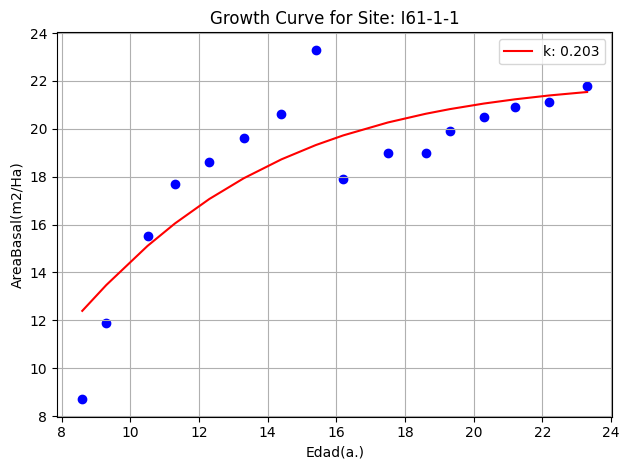

Failed to fit curve for site I64-12-1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


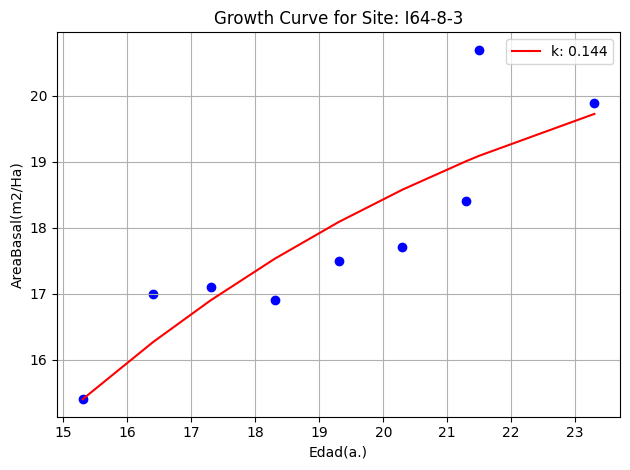

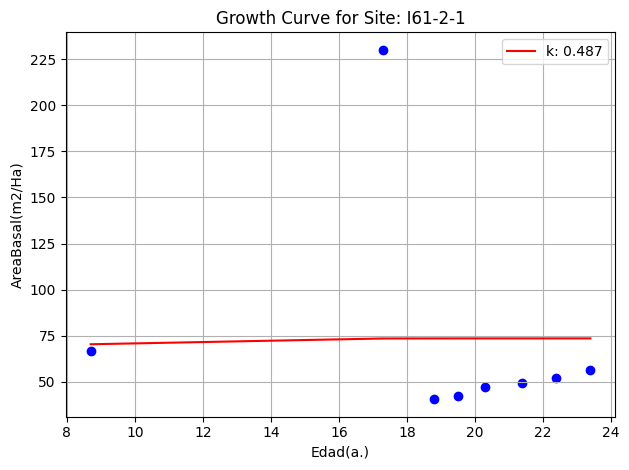

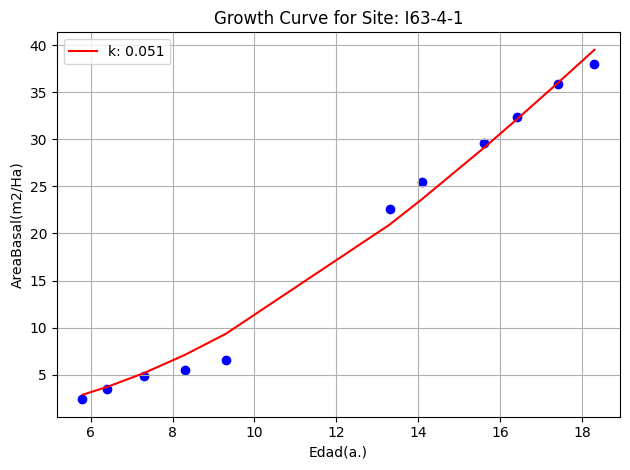

Failed to fit curve for site I63-7-1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


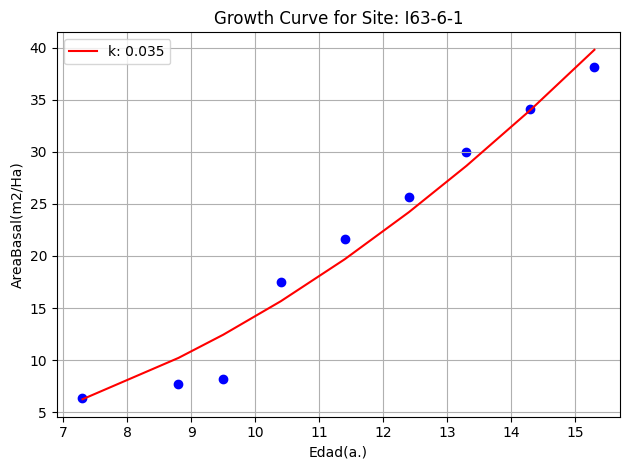

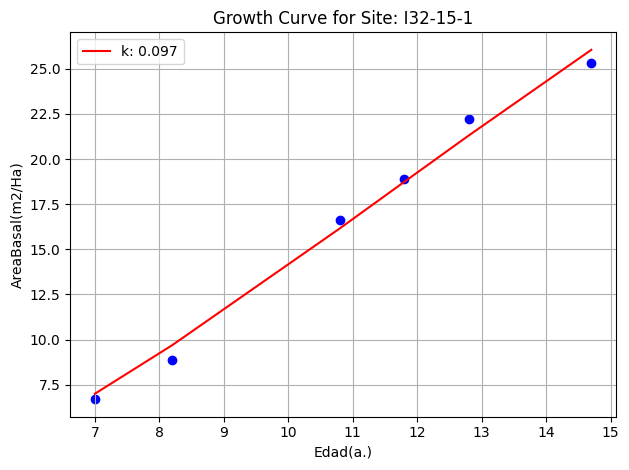

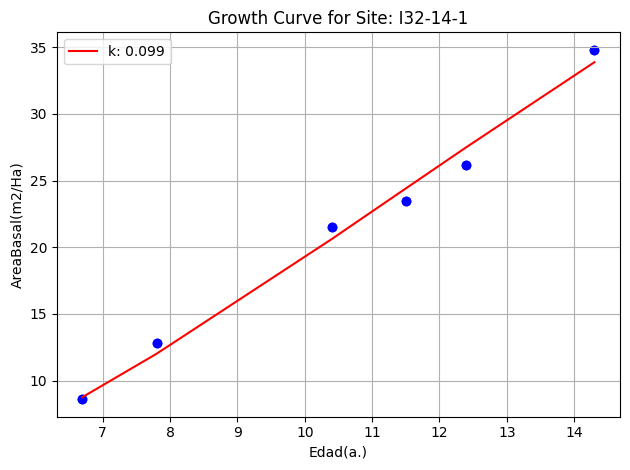

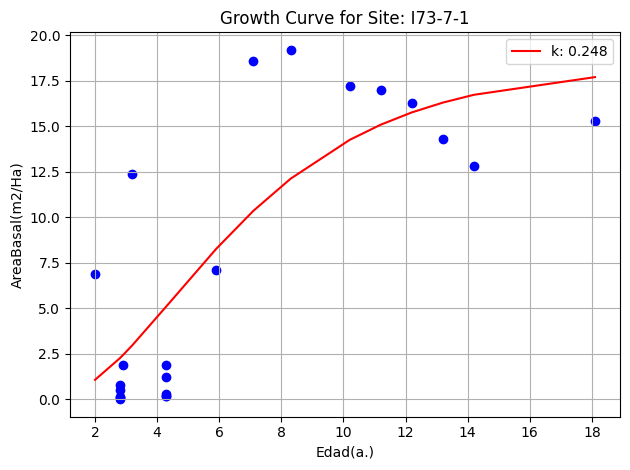

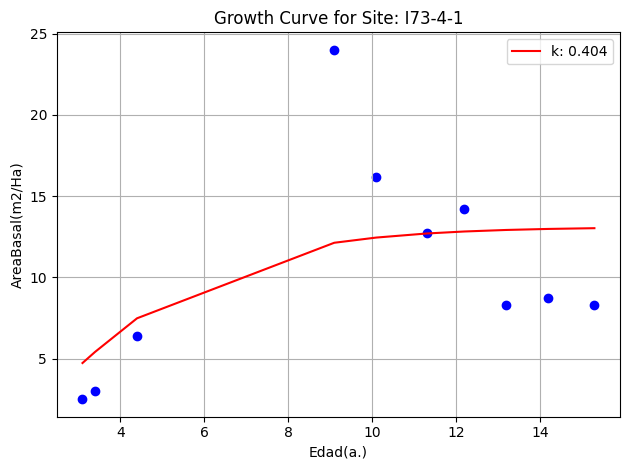

...

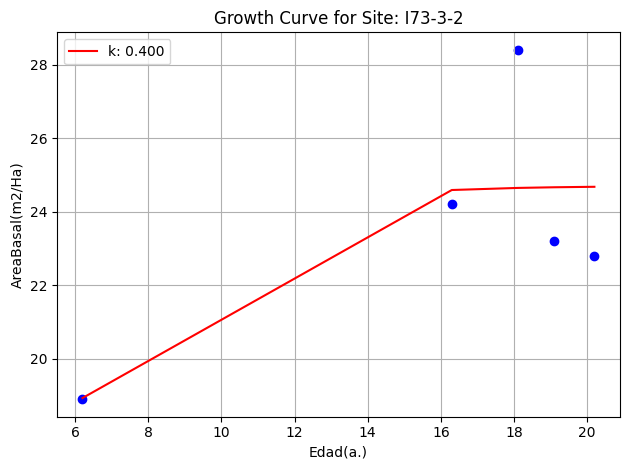

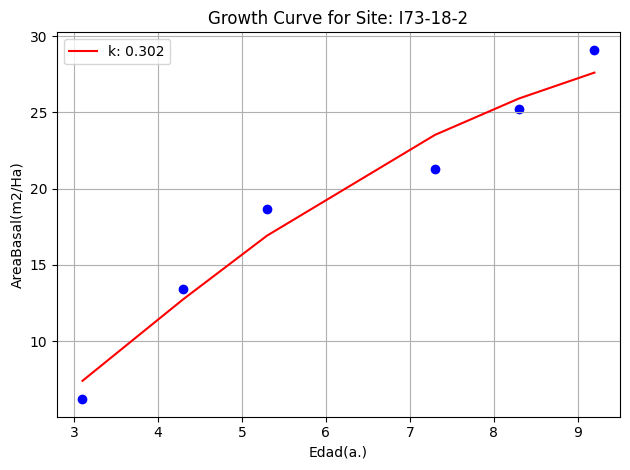

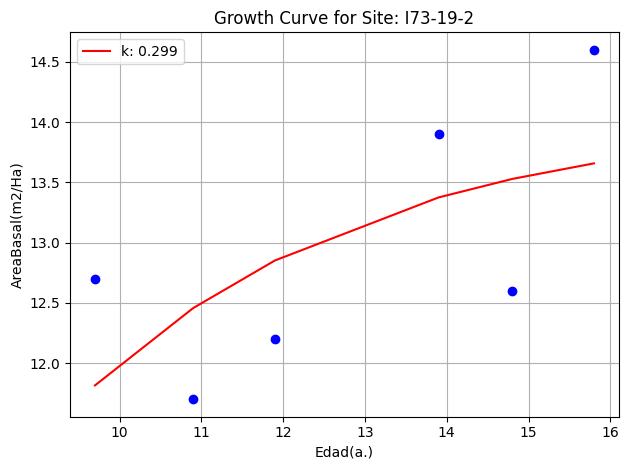

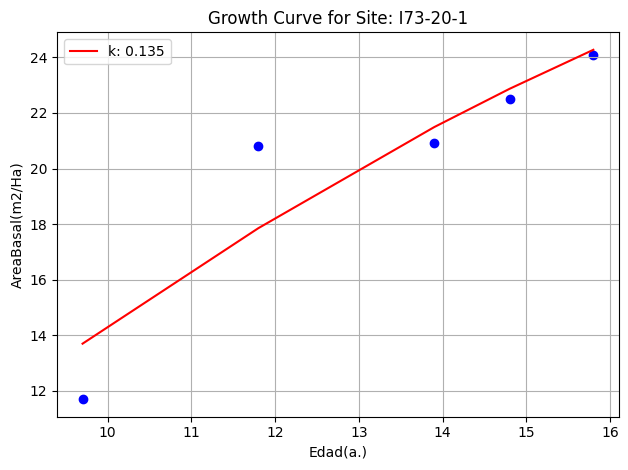

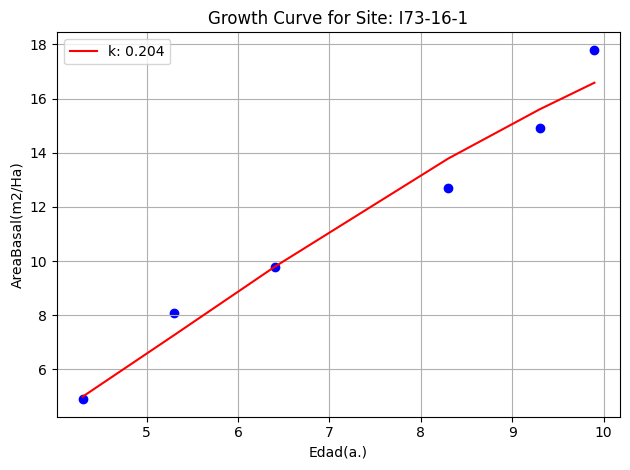

Failed to fit curve for site I73-22-1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


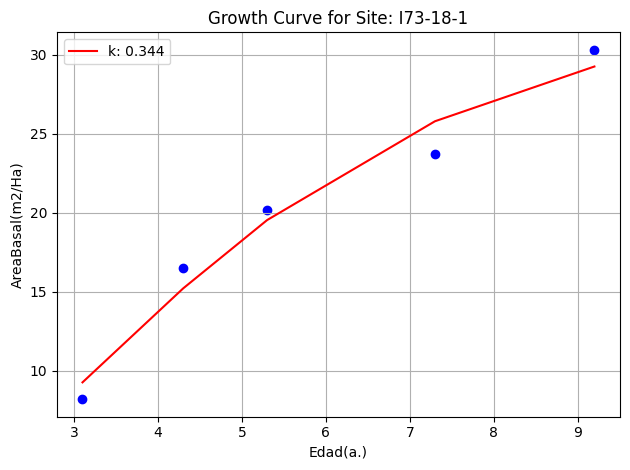

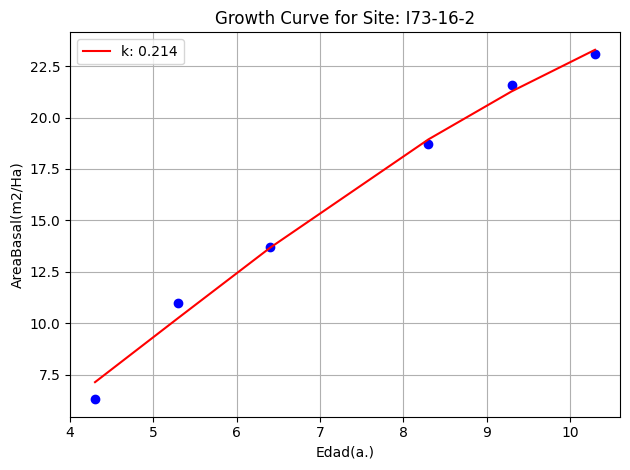

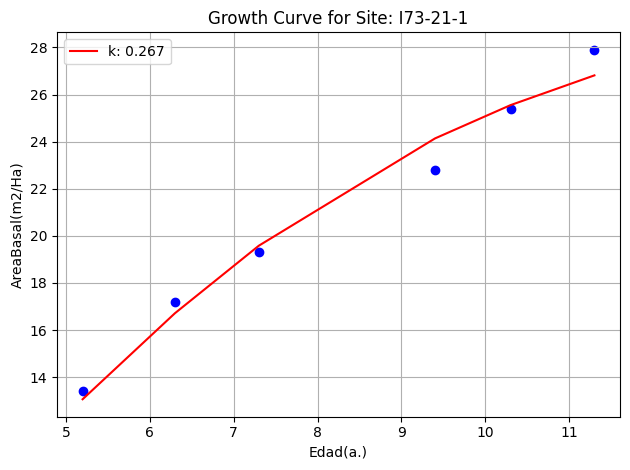

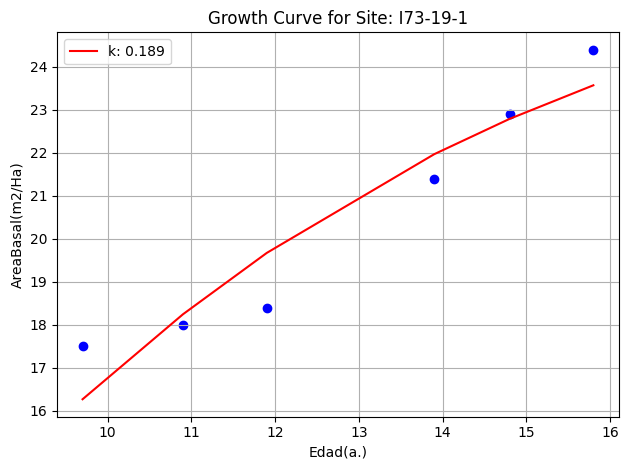

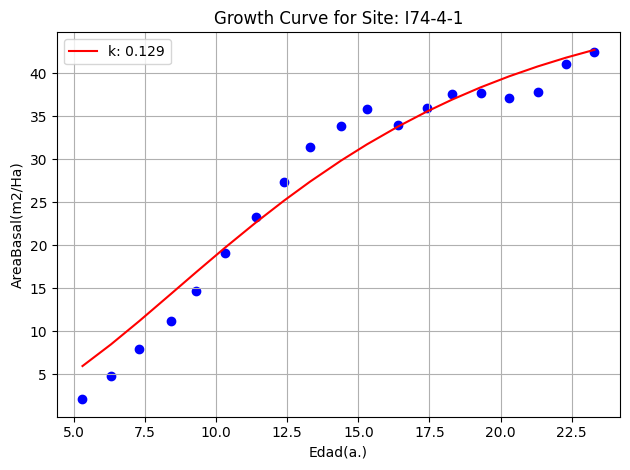

...

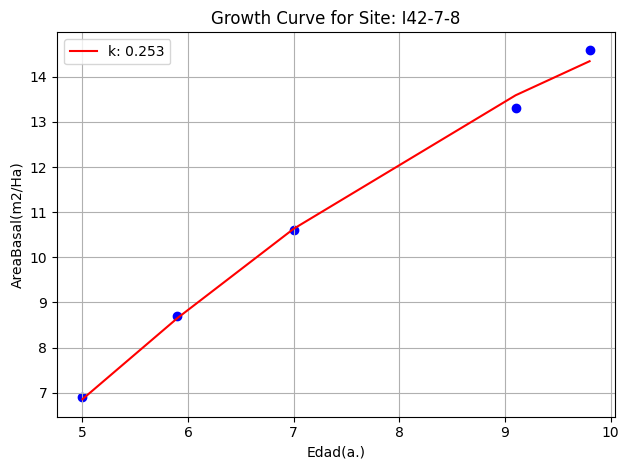

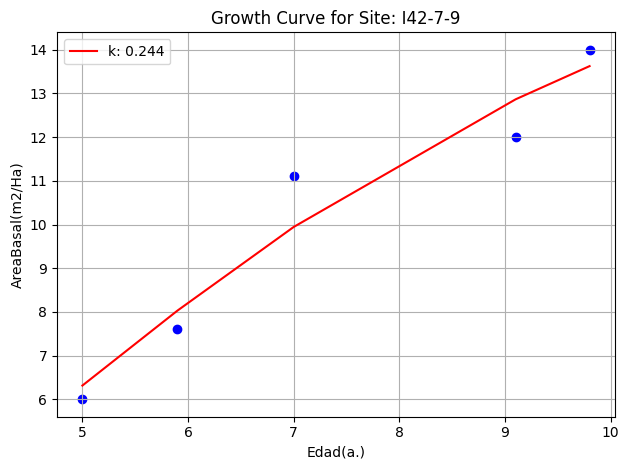

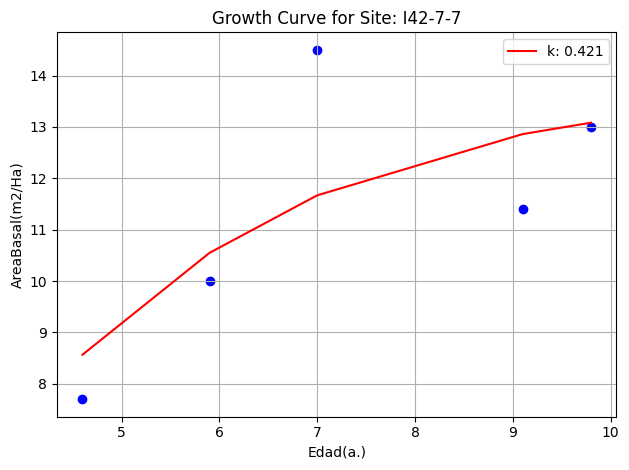

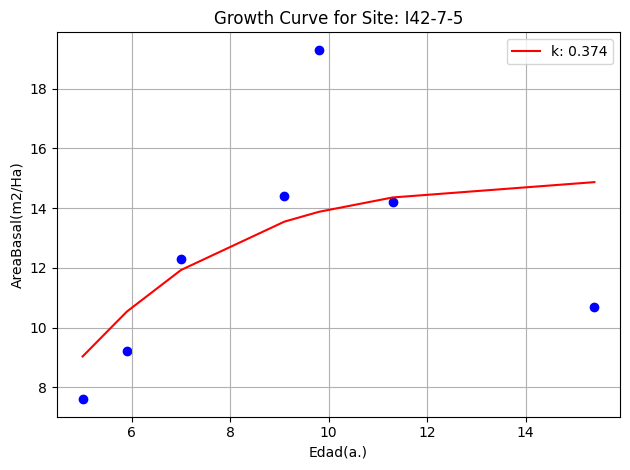

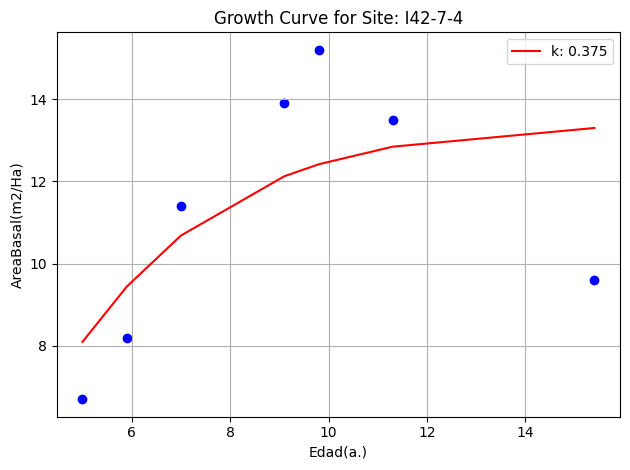

C:\Users\dinol\anaconda3\envs\py39\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


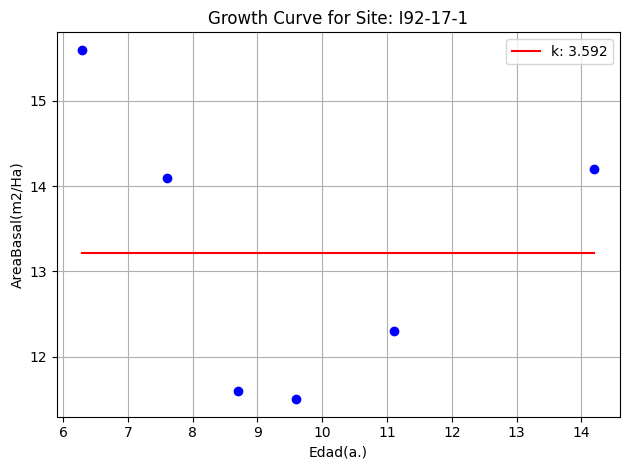

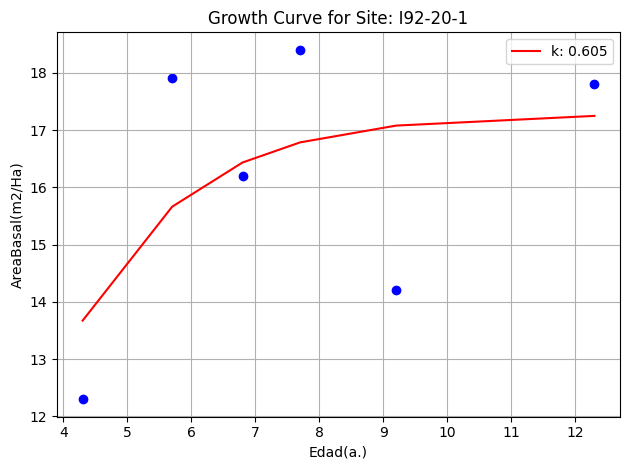

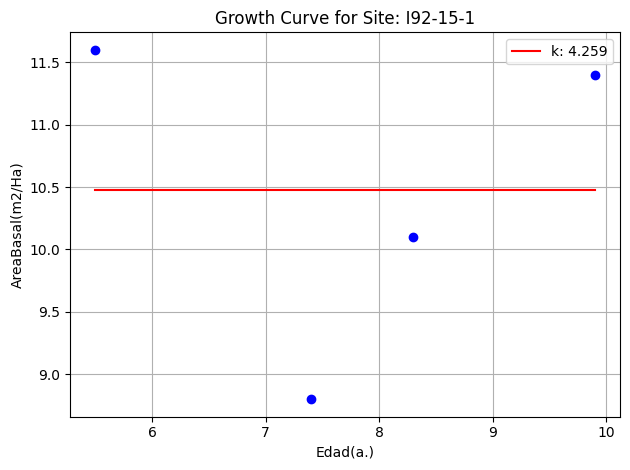

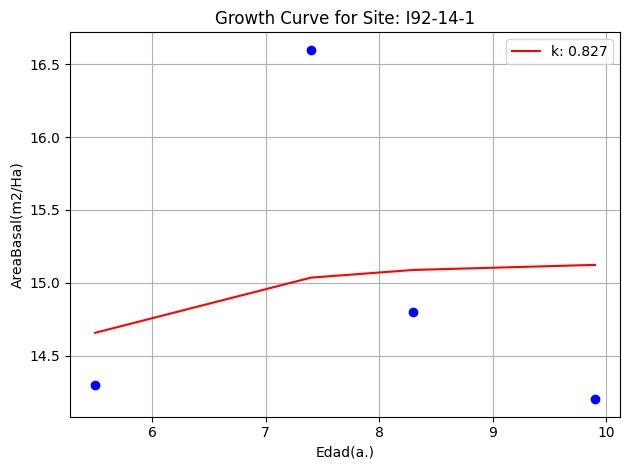

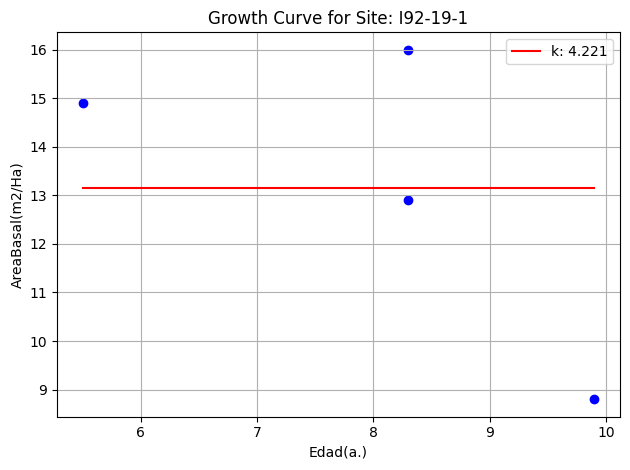

...

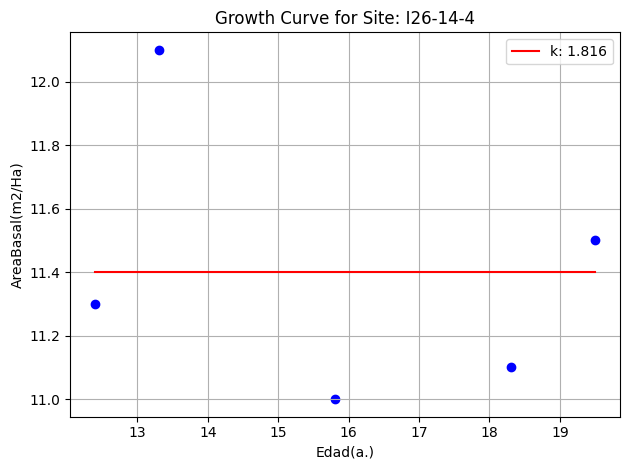

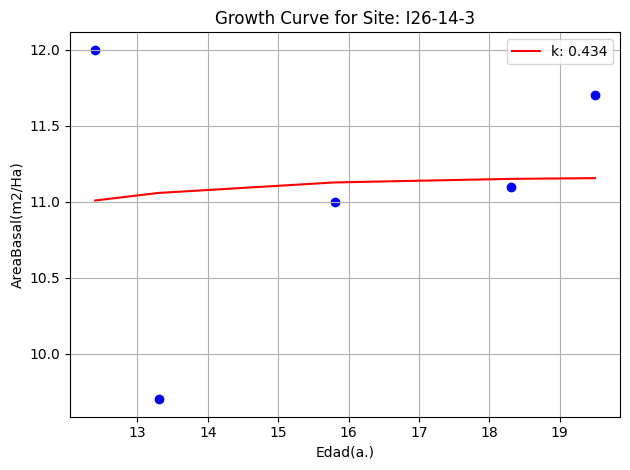

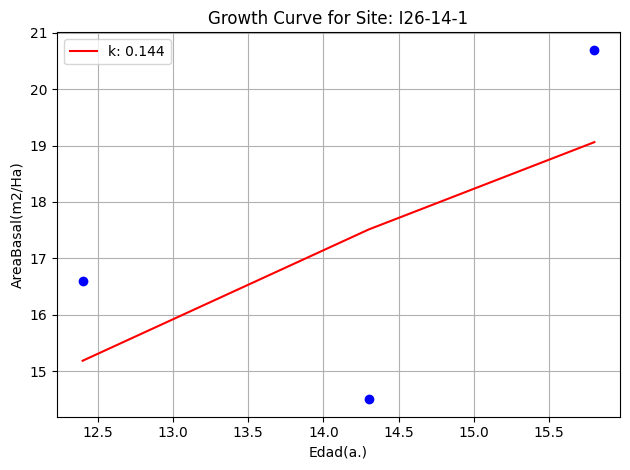

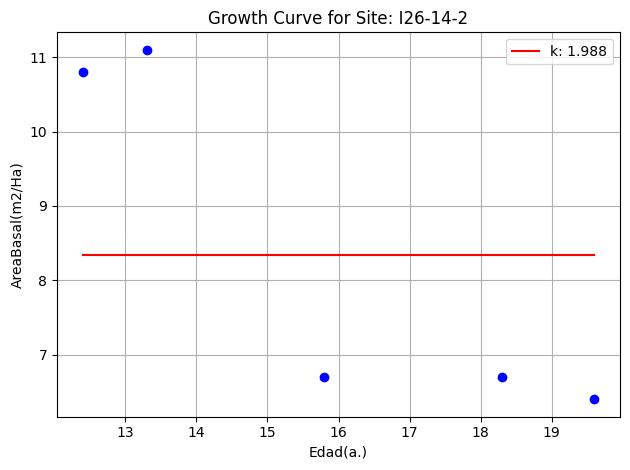

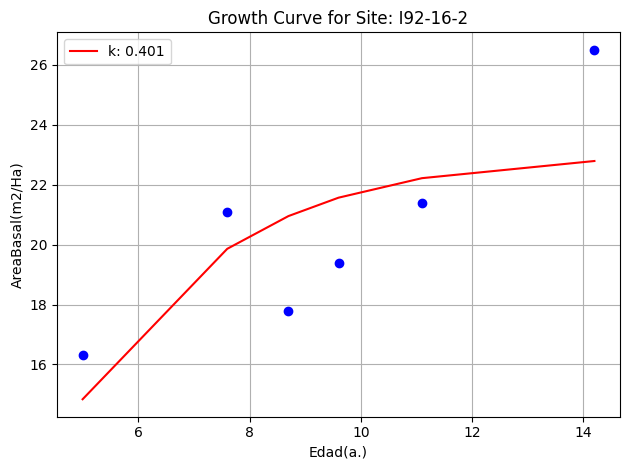

Failed to fit curve for site I63-5-1. Error: array must not contain infs or NaNs


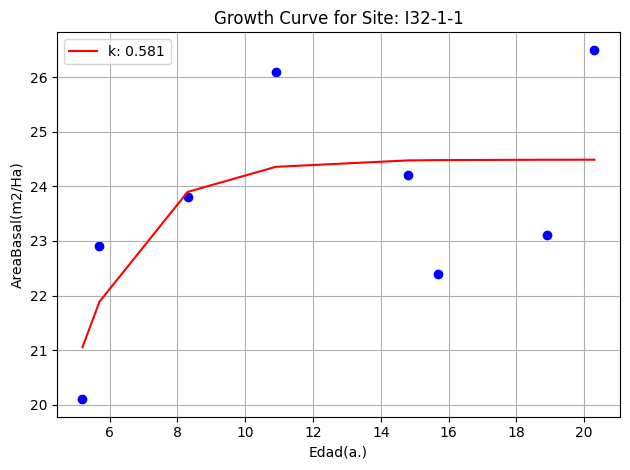

Failed to fit curve for site I72-5-1. Error: array must not contain infs or NaNs


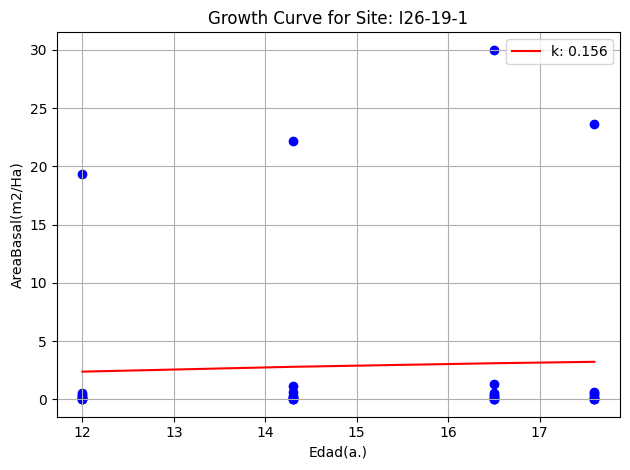

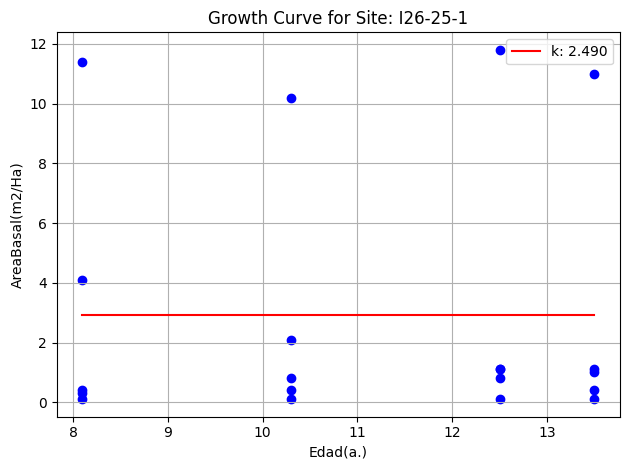

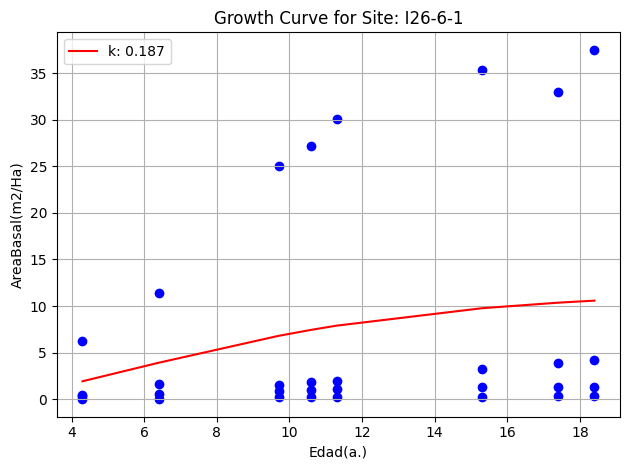

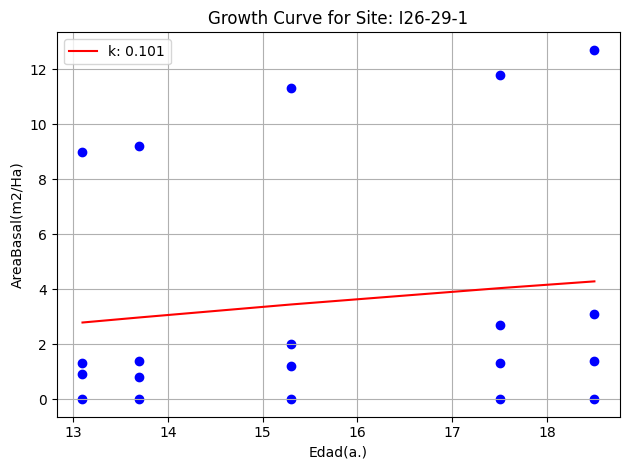

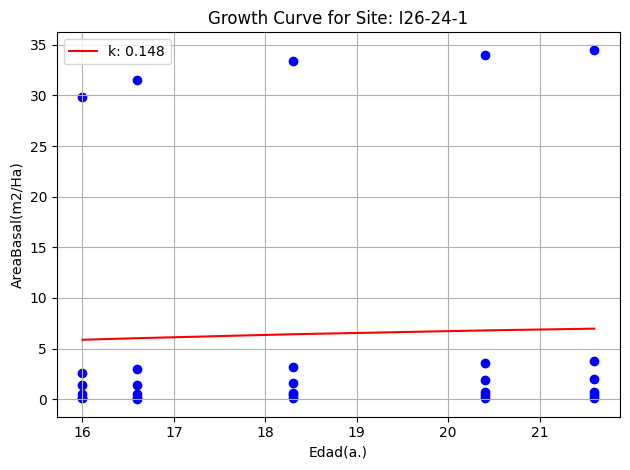

...

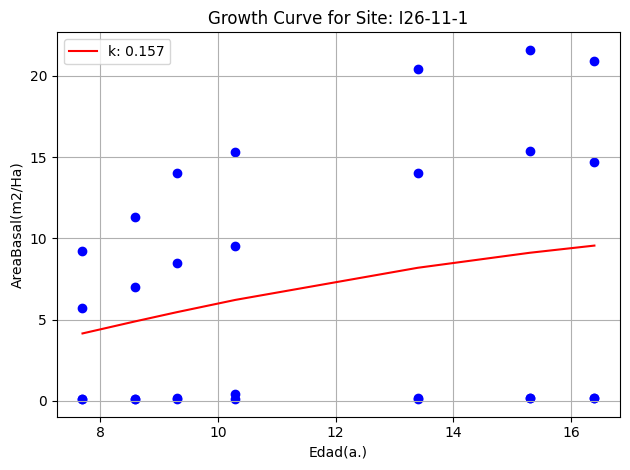

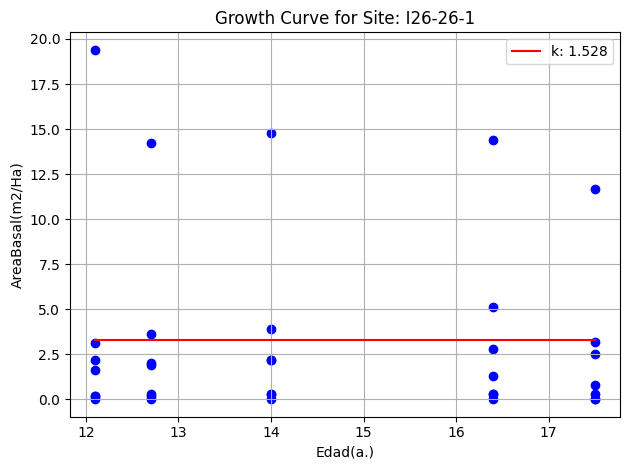

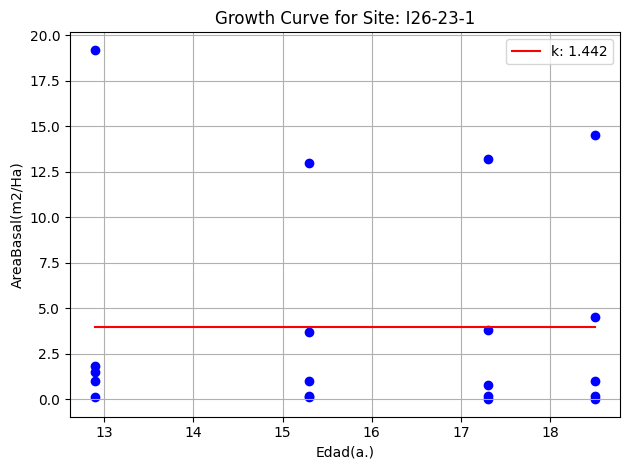

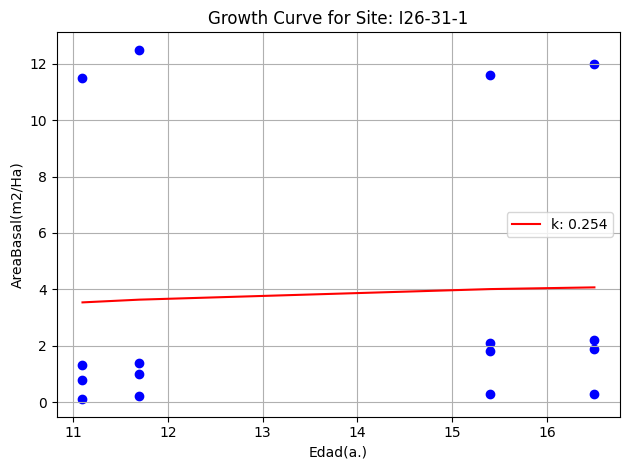

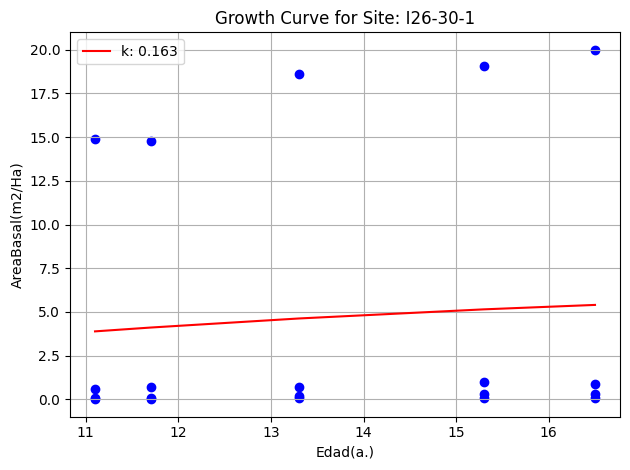

Failed to fit curve for site I26-28-1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


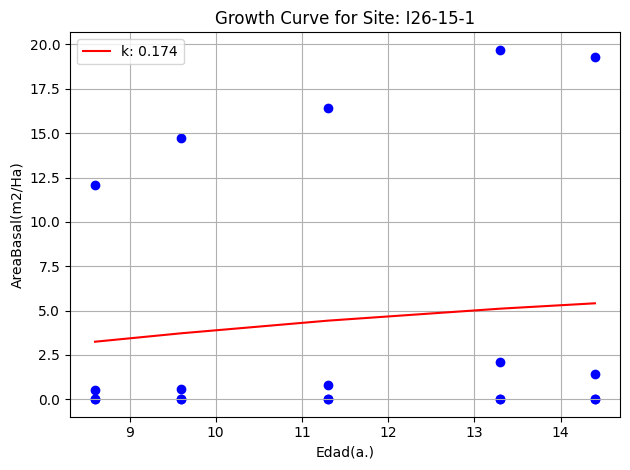

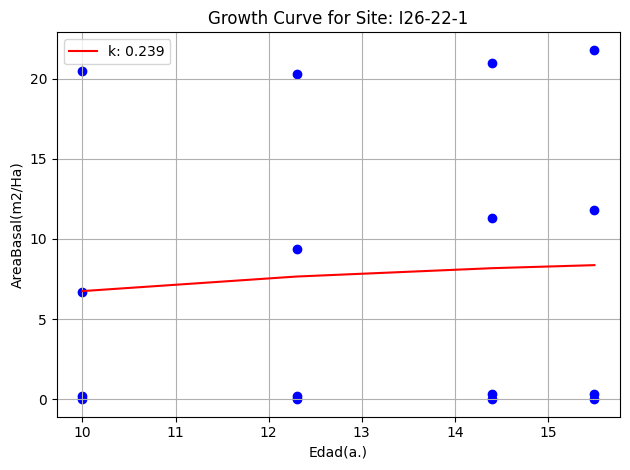

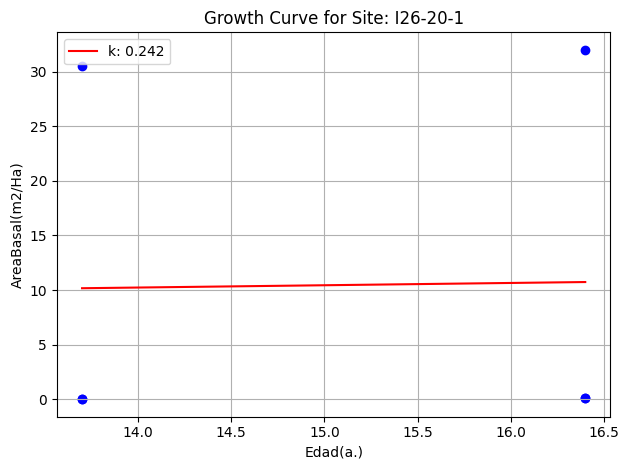

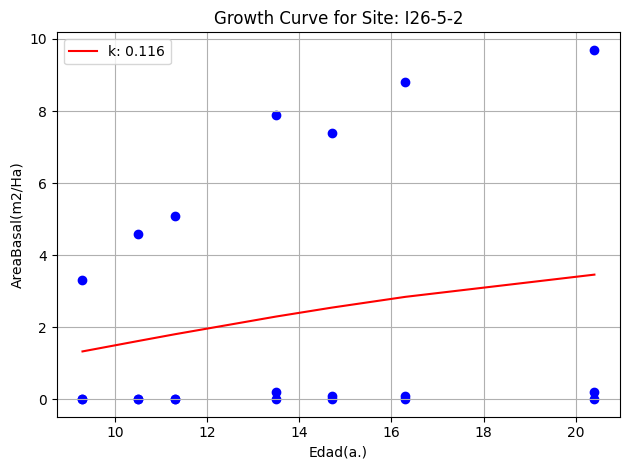

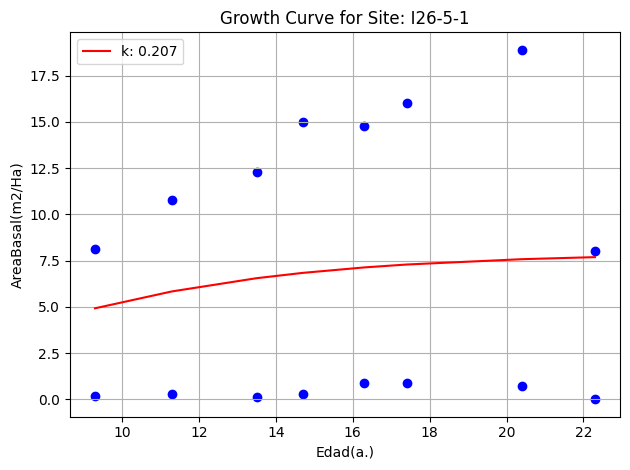

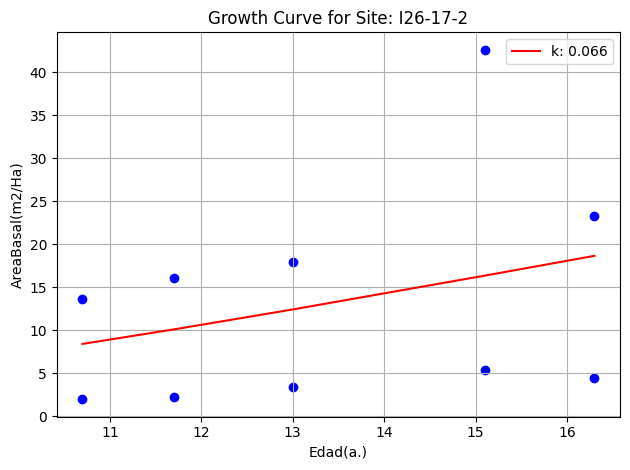

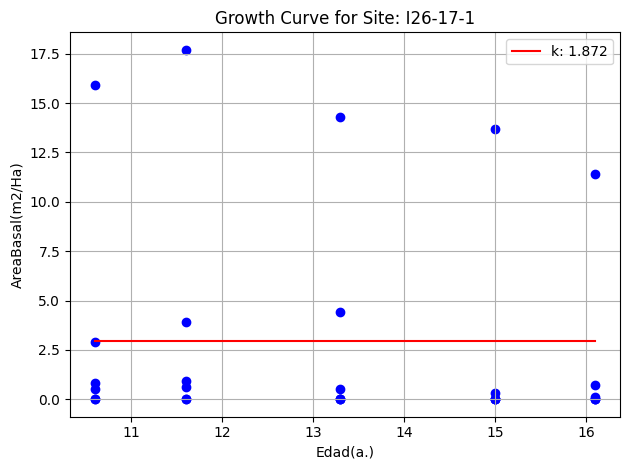

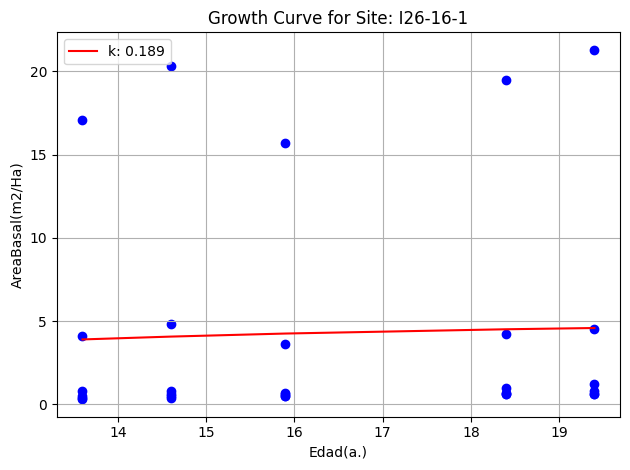

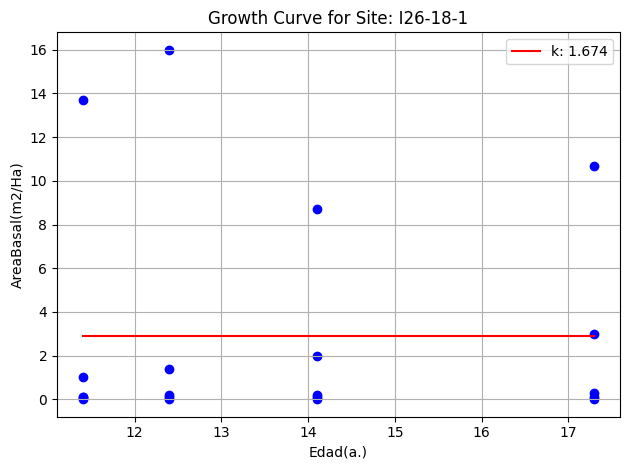

Failed to fit curve for site I26-7-1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


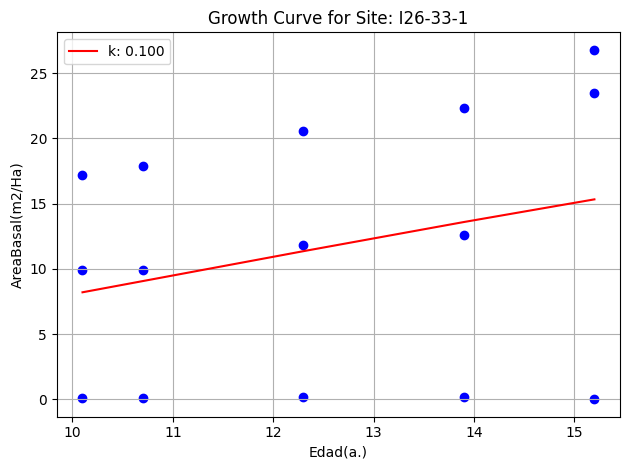

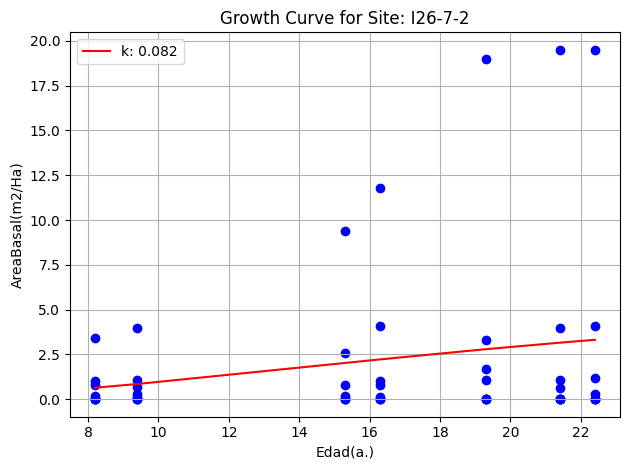

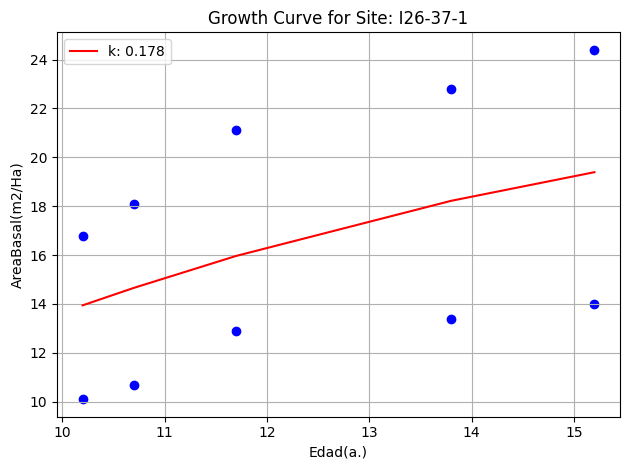

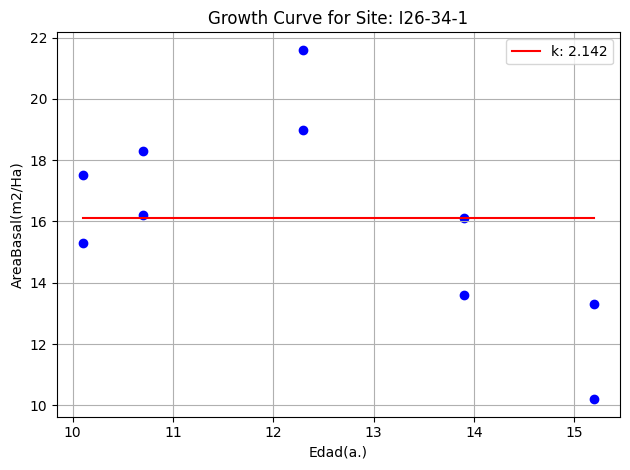

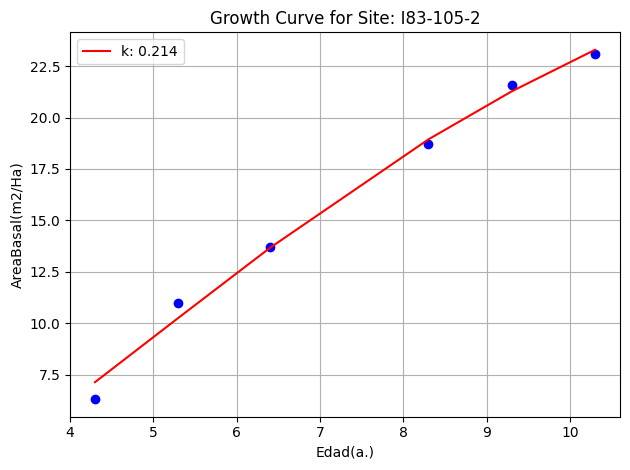

...

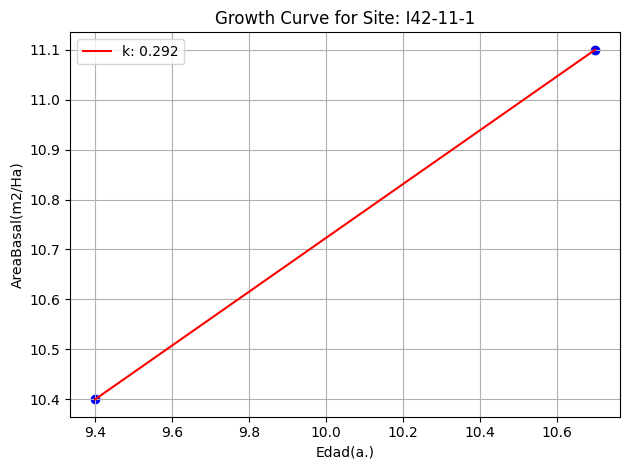

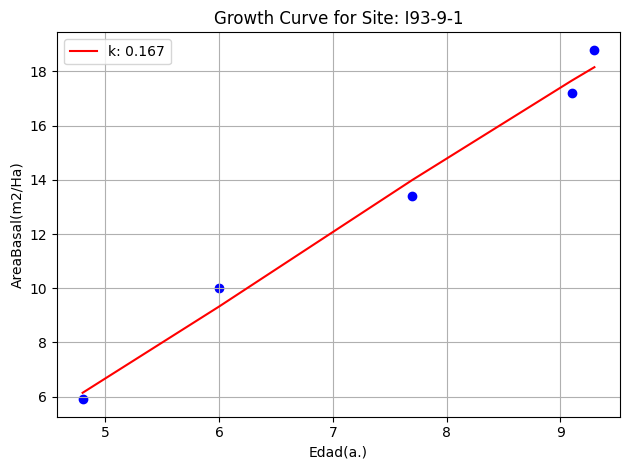

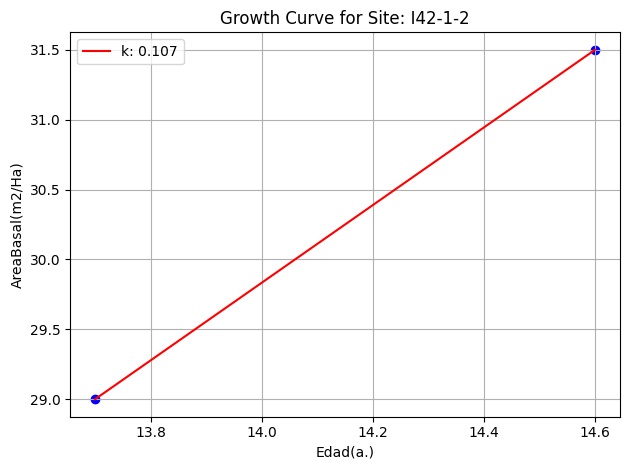

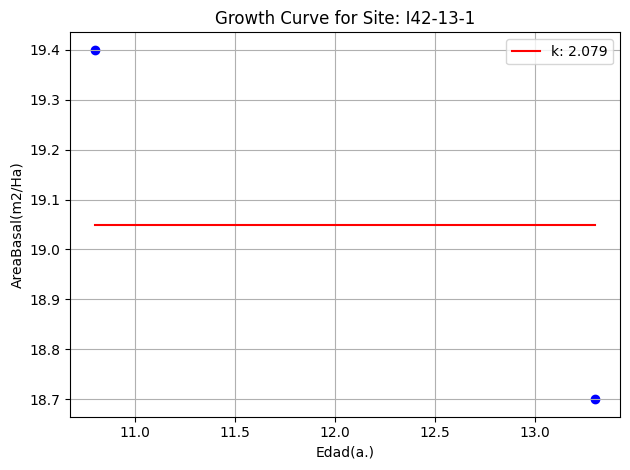

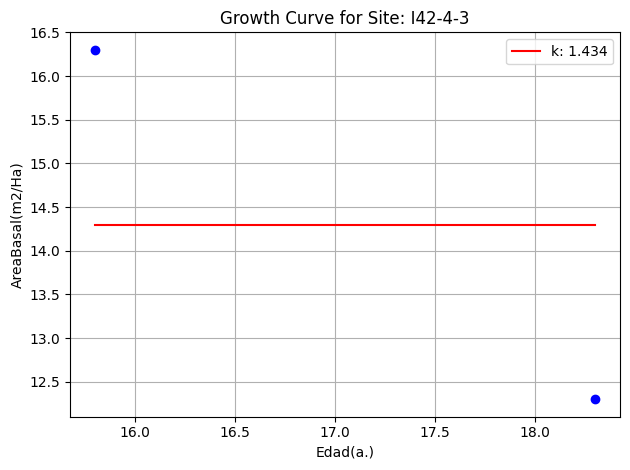

In [76]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def generate_growth_curve_plots(data):
    data['AreaBasal(m2/Ha)'].replace({"--": np.nan, "***.*": np.nan}, inplace=True)
    data = data.dropna(subset=['AreaBasal(m2/Ha)'])
    data['AreaBasal(m2/Ha)'] = data['AreaBasal(m2/Ha)'].astype(float)

    def growth_curve(t, k, A):
        m = 0.67  # fixed value
        b = 1  # fixed value
        return A * (1 - b * np.exp(-k * t))**(1 / (1 - m))

    unique_sites = data['codigoparc'].unique()

    output_directory = 'site_plots'
    os.makedirs(output_directory, exist_ok=True)
    records = []

    for site in unique_sites:
        df_site = data[data['codigoparc'] == site]
        species = df_site['Especie'].unique()[0]

        t_values = df_site['Edad(a.)'].tolist()
        y_values = df_site['AreaBasal(m2/Ha)'].tolist()

        initial_guess = [0.01, max(y_values)]
        try:
            params, _ = curve_fit(growth_curve, np.array(t_values), np.array(y_values), p0=initial_guess)
            k, A = params
            plt.figure()
            plt.scatter(t_values, y_values, c='blue', marker='o')
            t_sorted = np.sort(np.array(t_values))
            plt.plot(t_sorted, growth_curve(t_sorted, k, A), label=f'k: {k:.3f}', color='red')
            plt.xlabel('Edad(a.)')
            plt.ylabel('AreaBasal(m2/Ha)')
            plt.title(f'Growth Curve for Site: {site}')
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            output_filename = os.path.join(output_directory, f'growth_curve_{site}.png')
            plt.savefig(output_filename)
            plt.show()
            record = {
                "codigoparc": site,
                "X": df_site['X'].unique()[0],
                "Y": df_site['Y'].unique()[0],
                "Especie": species,
                "k": k
            }
            records.append(record)
        except Exception as e:
            print(f"Failed to fit curve for site {site}. Error: {e}")
            continue

    df_records = pd.DataFrame(records)
    df_records.to_csv("site_k_values.csv", index=False)

generate_growth_curve_plots(data)


## fit with segments

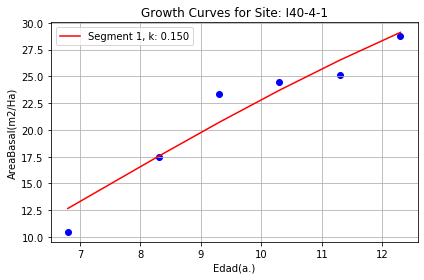

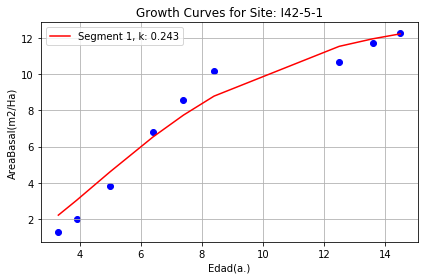

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


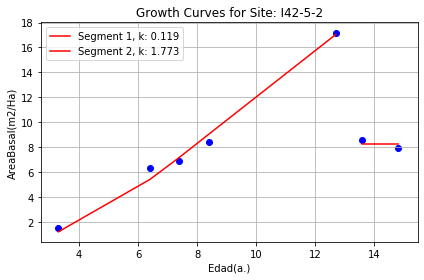

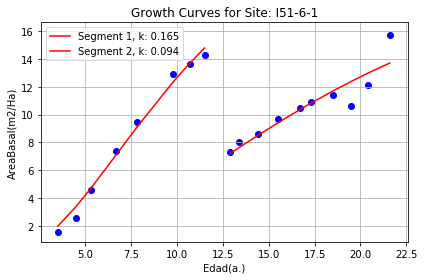

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in exp
  from ipykernel import kernelapp as app
C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app
No handles with labels found to put in legend.


Failed to fit curve for site I51-9-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


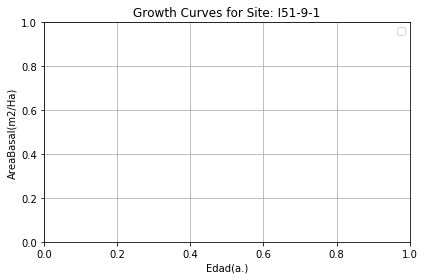

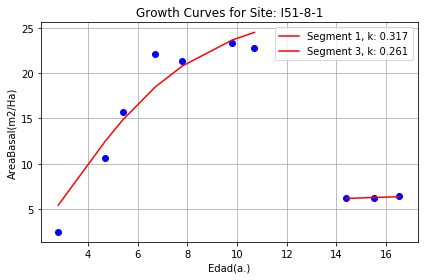

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


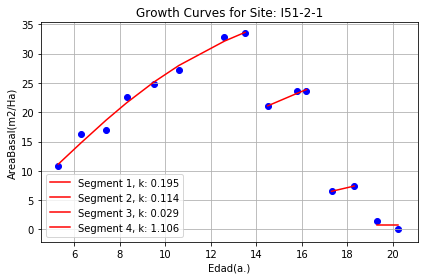

Failed to fit curve for site I51-1-2, segment 3. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


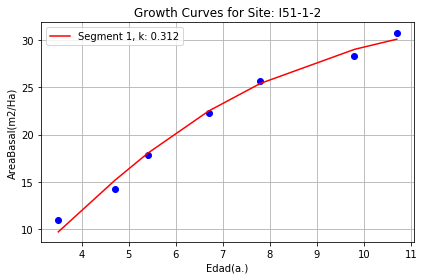

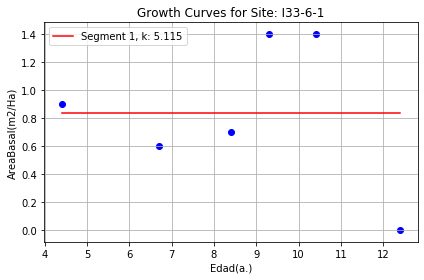

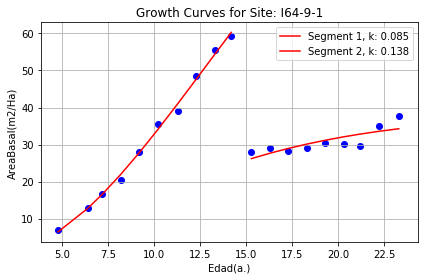

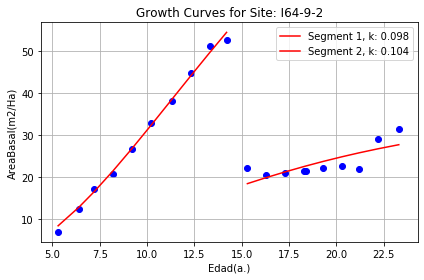

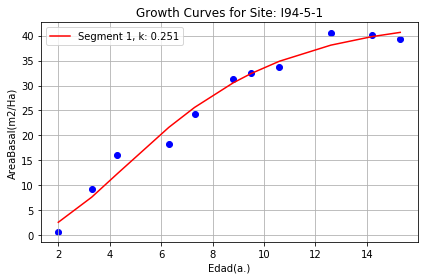

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


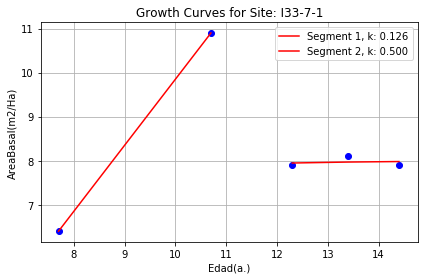

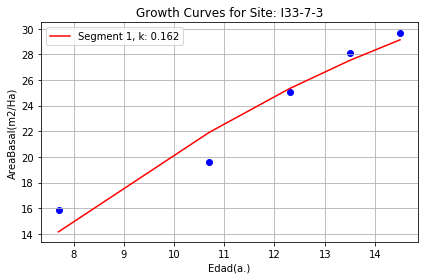

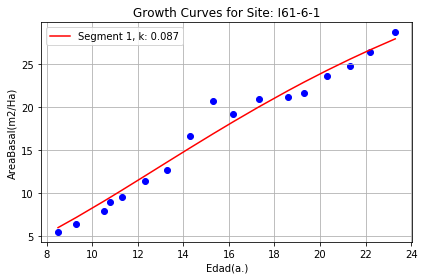

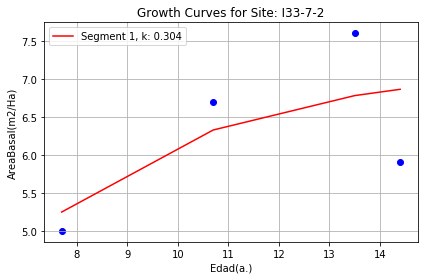

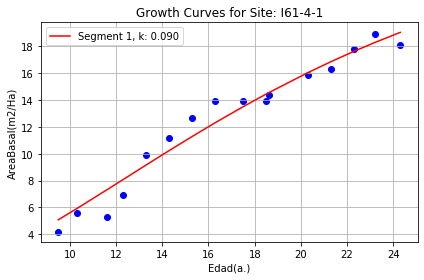

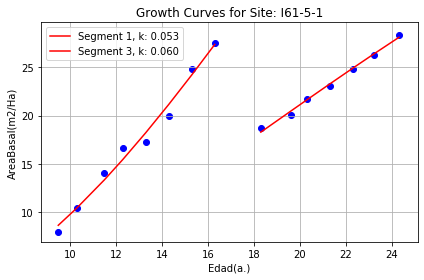

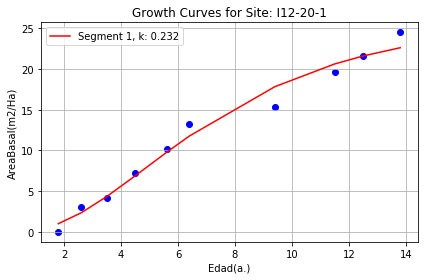

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


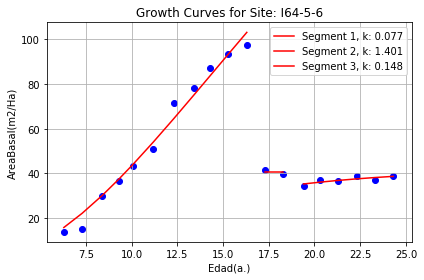

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


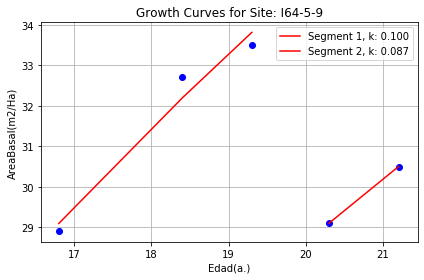

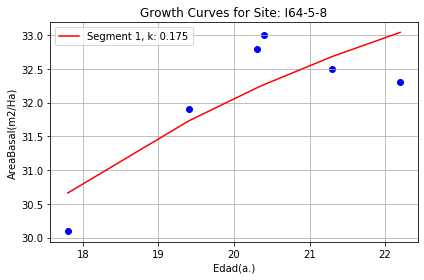

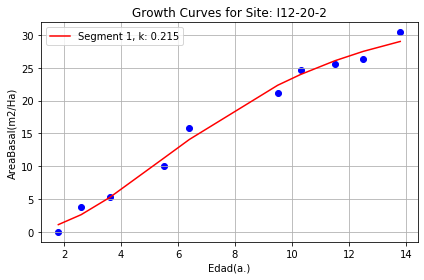

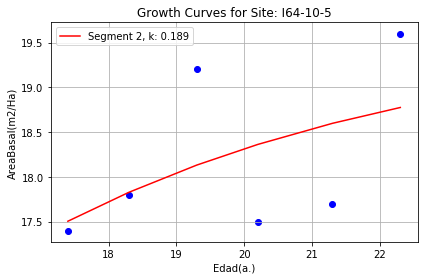

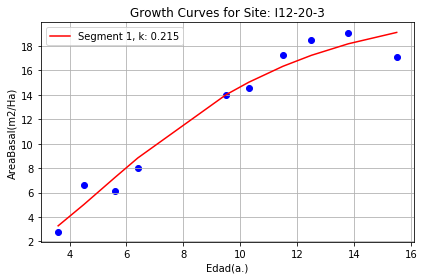

No handles with labels found to put in legend.


Failed to fit curve for site I12-20-4, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


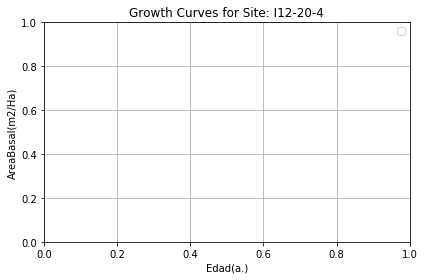

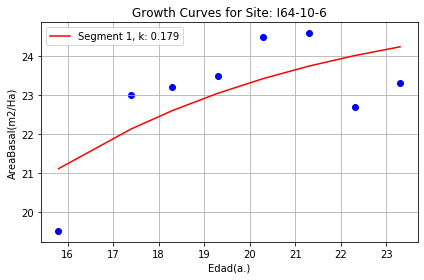

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app


Failed to fit curve for site I64-5-7, segment 2. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


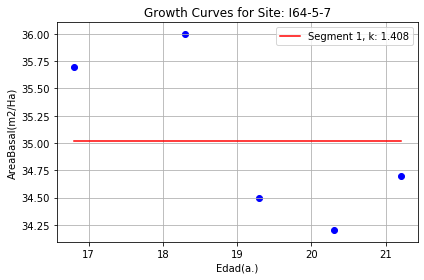

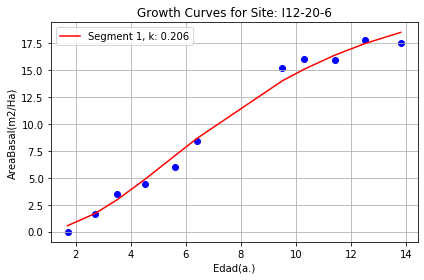

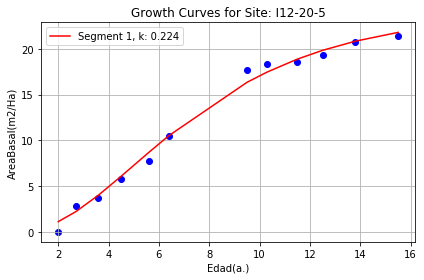

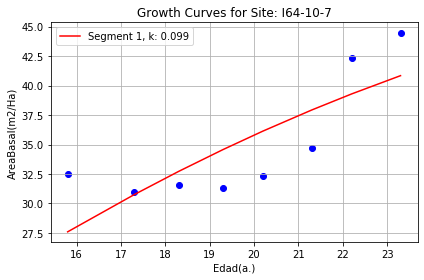

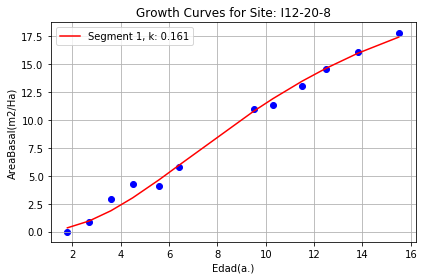

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


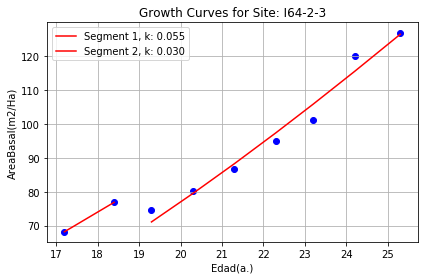

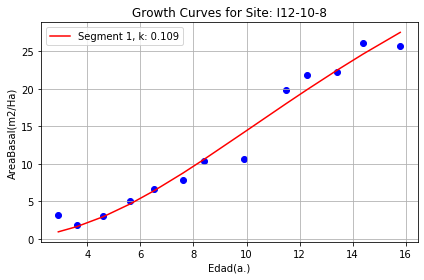

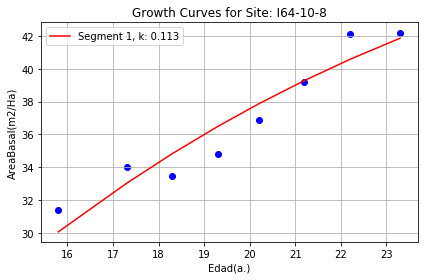

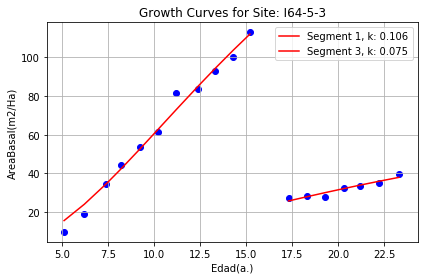

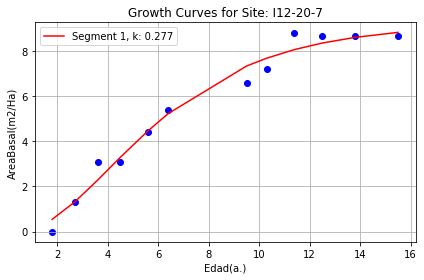

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


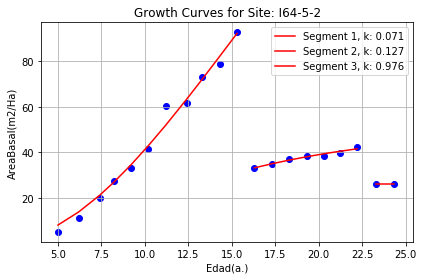

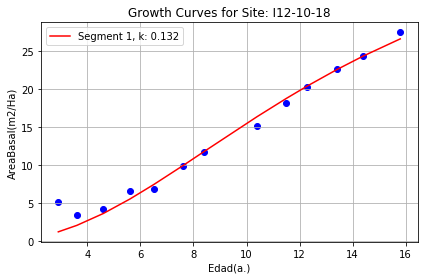

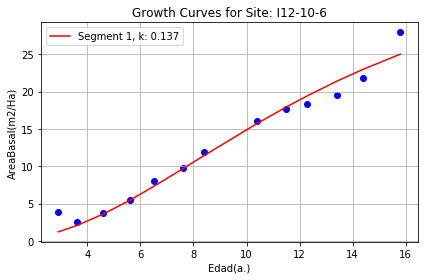

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app


Failed to fit curve for site I12-10-17, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


No handles with labels found to put in legend.


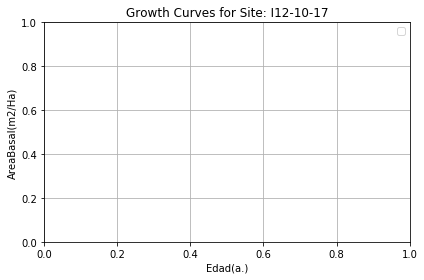

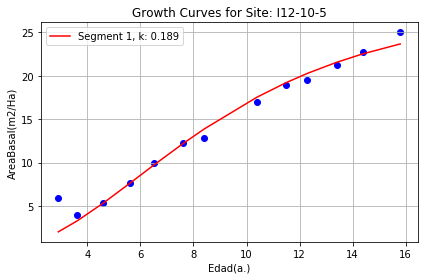

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app
No handles with labels found to put in legend.


Failed to fit curve for site I12-10-3, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


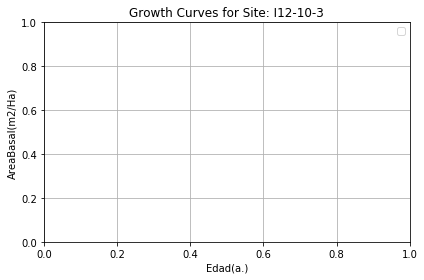

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


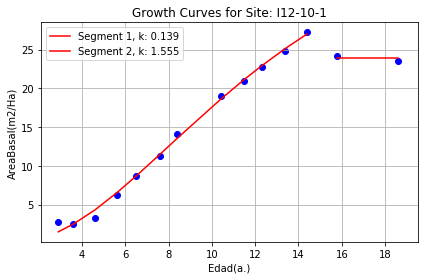

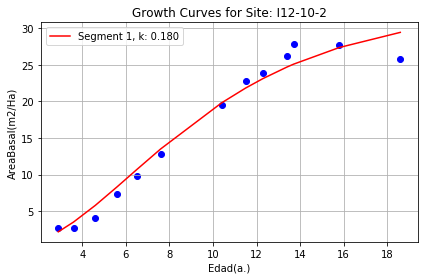

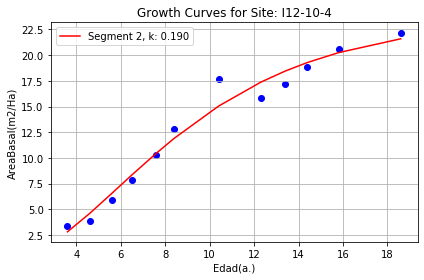

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


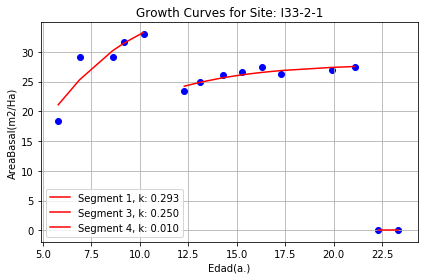

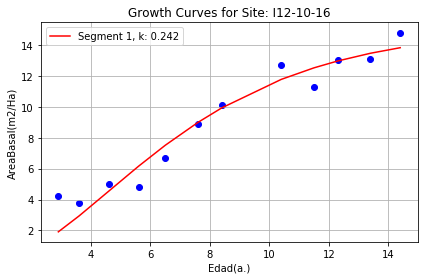

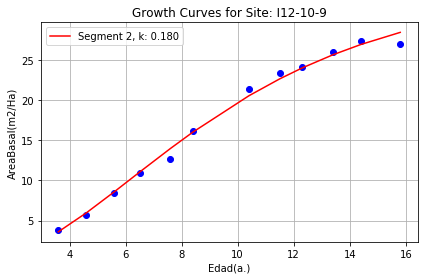

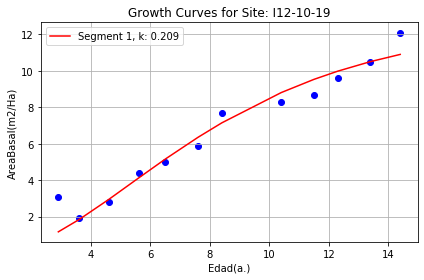

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


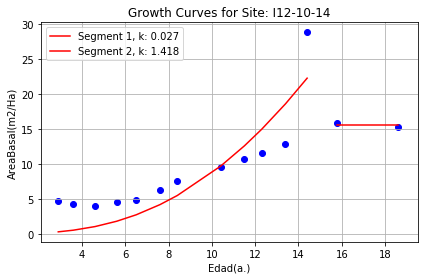

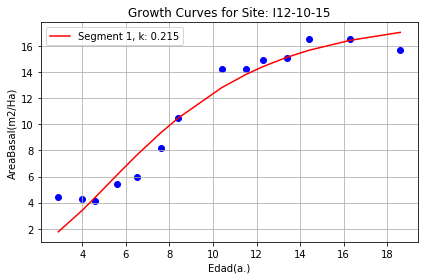

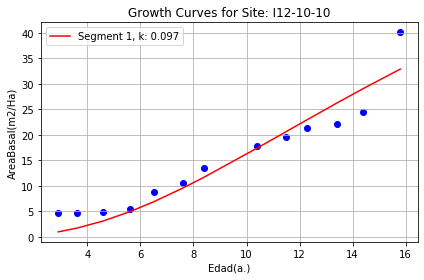

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app
No handles with labels found to put in legend.


Failed to fit curve for site I12-10-13, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


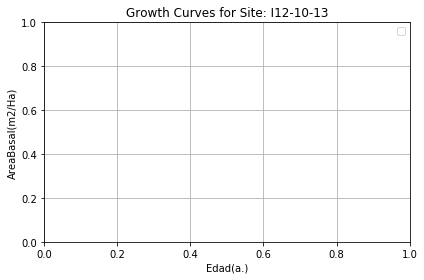

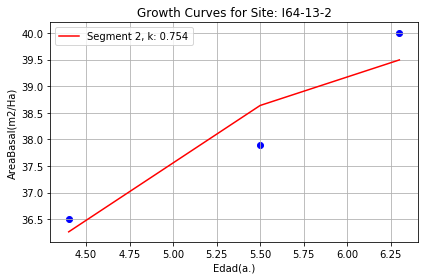

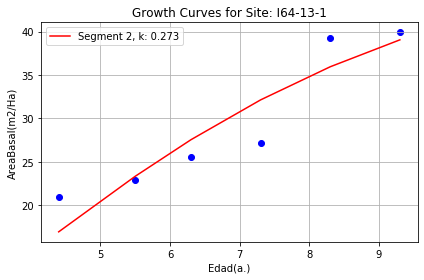

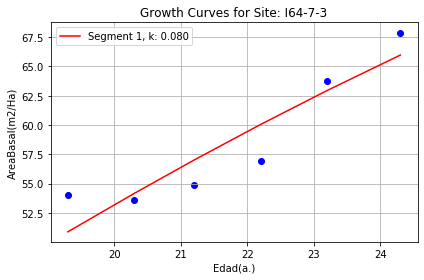

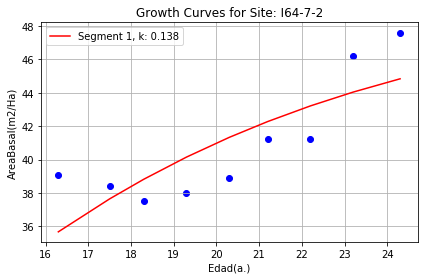

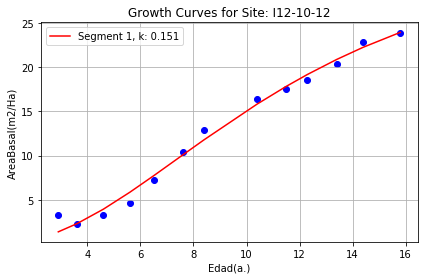

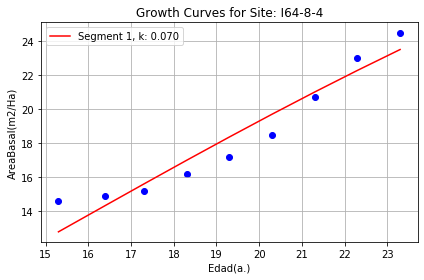

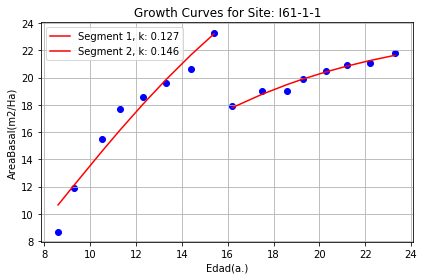

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app
No handles with labels found to put in legend.


Failed to fit curve for site I64-12-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


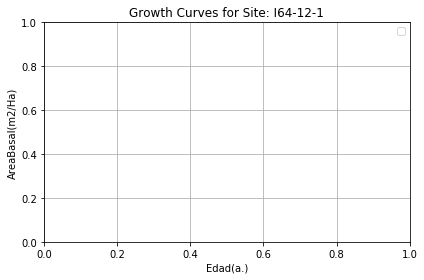

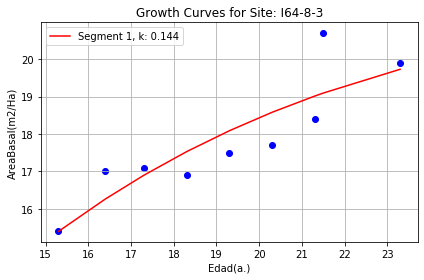

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


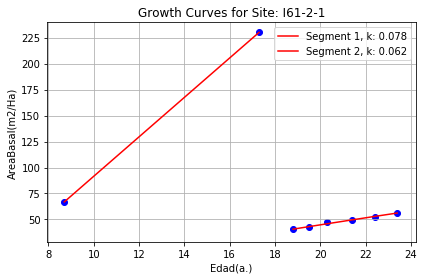

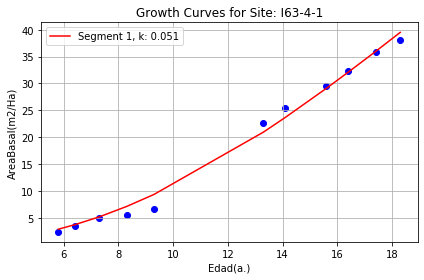

No handles with labels found to put in legend.


Failed to fit curve for site I63-7-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


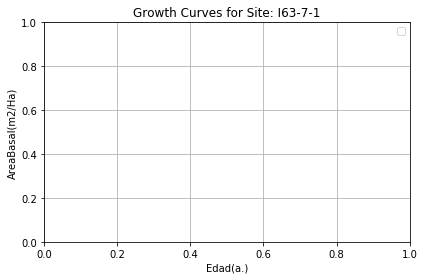

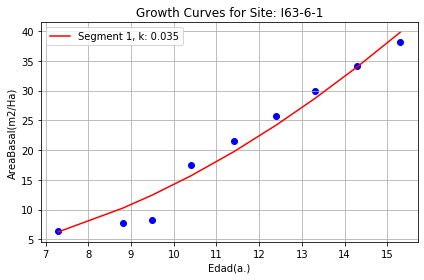

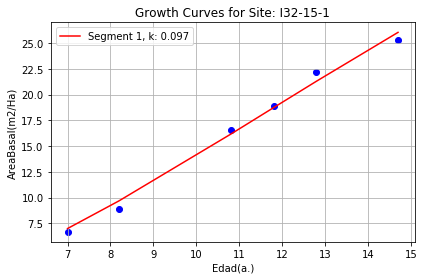

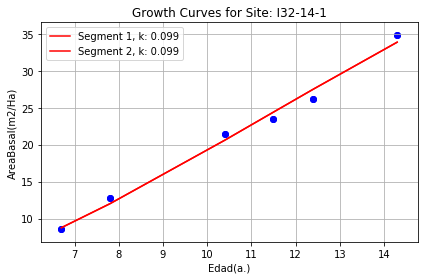

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


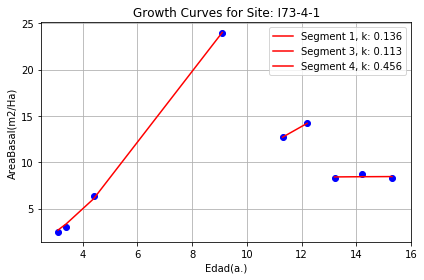

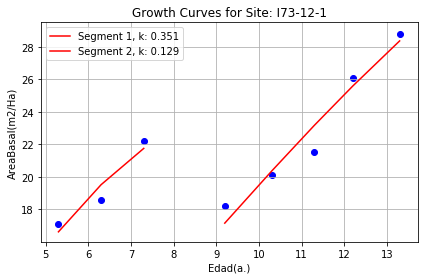

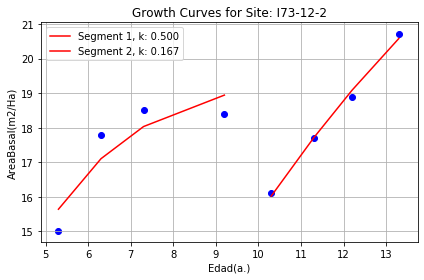

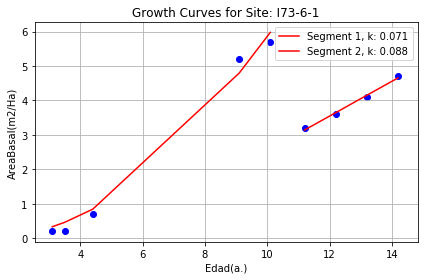

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


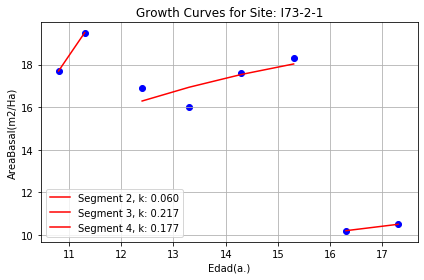

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app


Failed to fit curve for site I73-1-1, segment 3. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


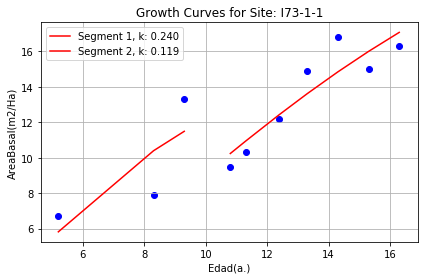

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


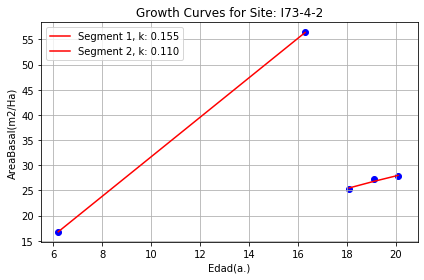

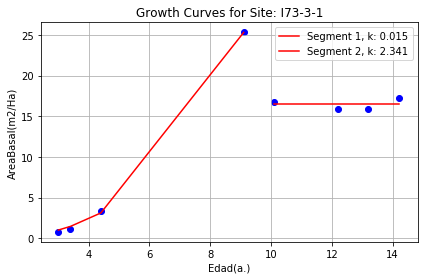

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


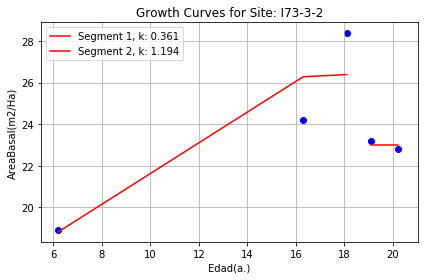

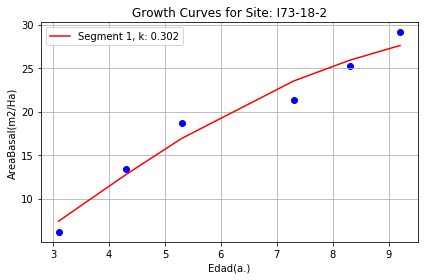

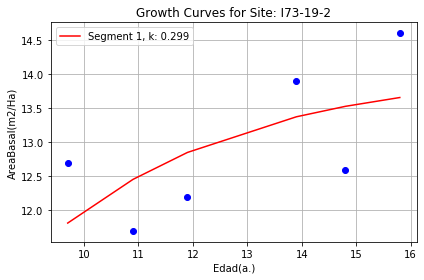

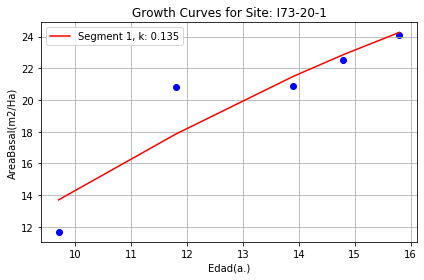

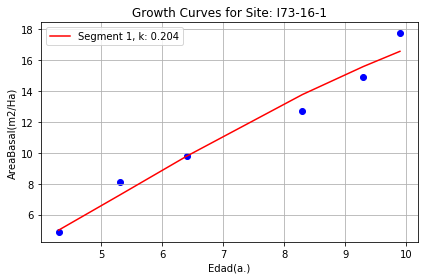

No handles with labels found to put in legend.


Failed to fit curve for site I73-22-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


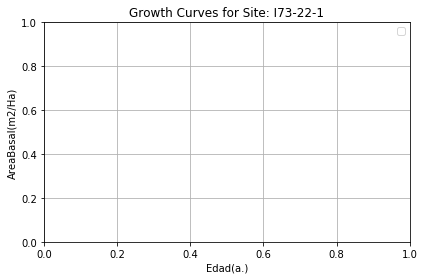

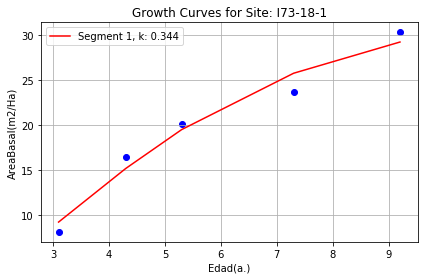

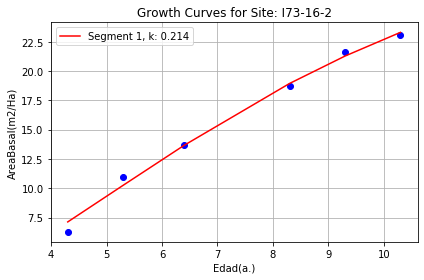

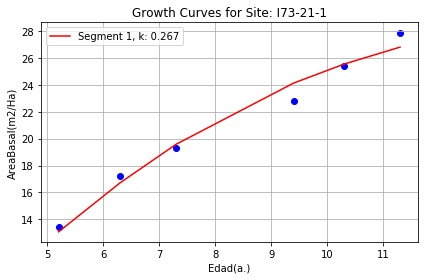

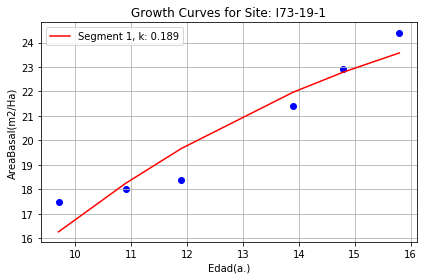

...

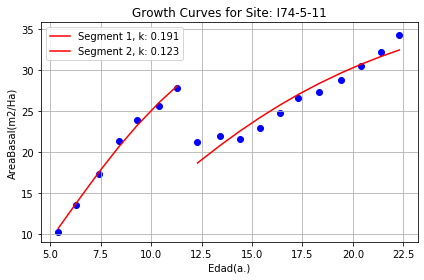

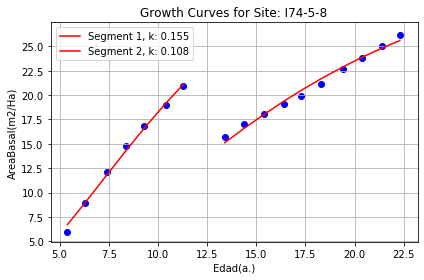

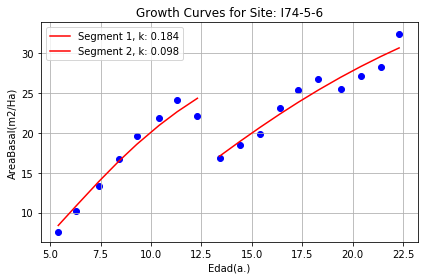

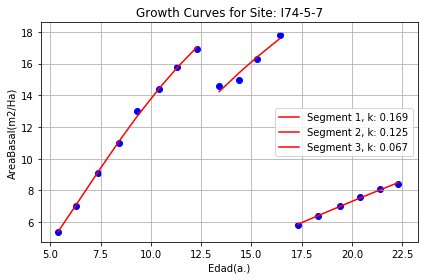

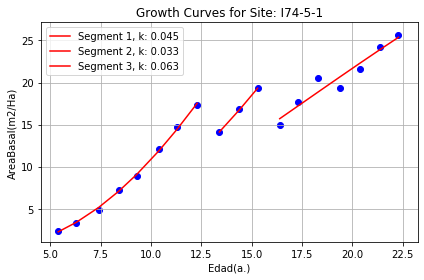

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app


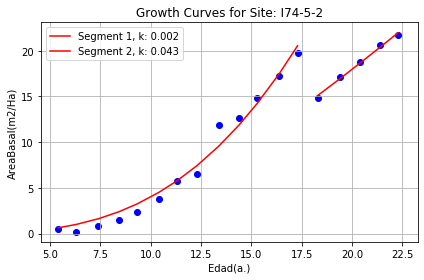

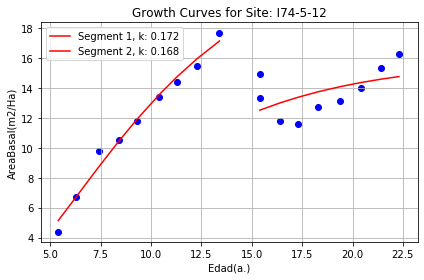

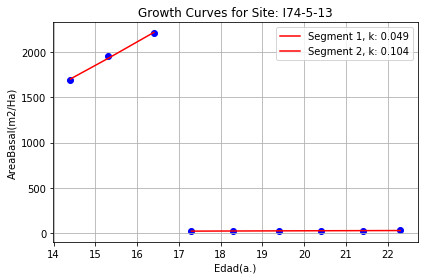

Failed to fit curve for site I40-5-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


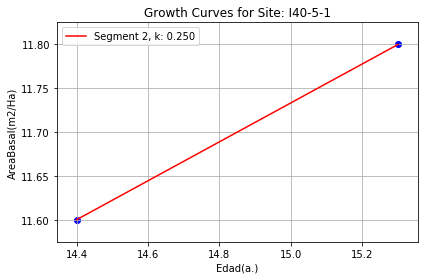

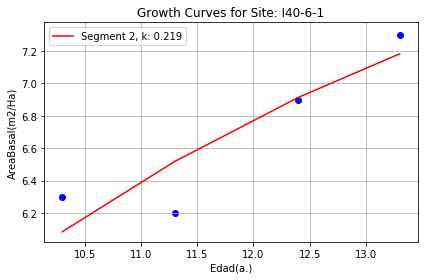

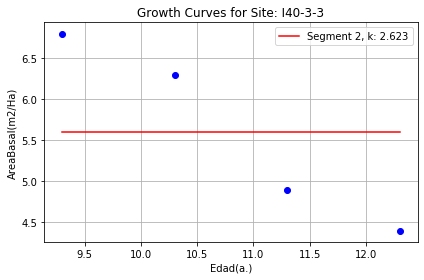

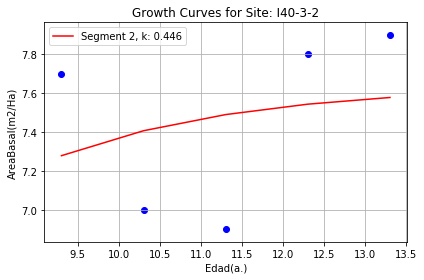

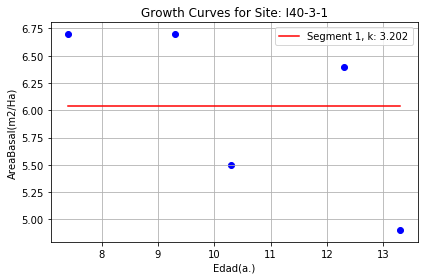

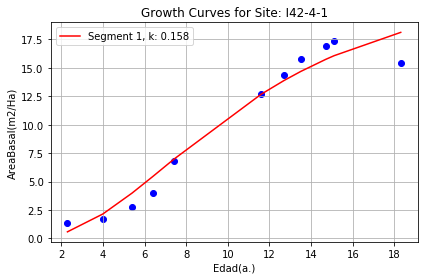

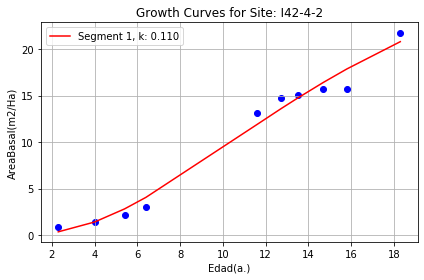

Failed to fit curve for site I92-9-3, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


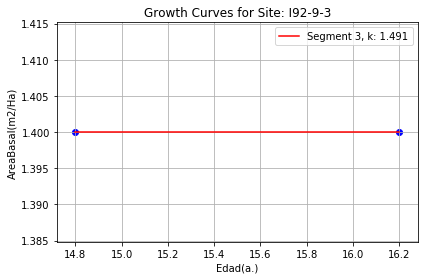

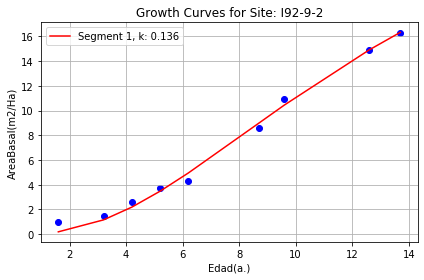

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


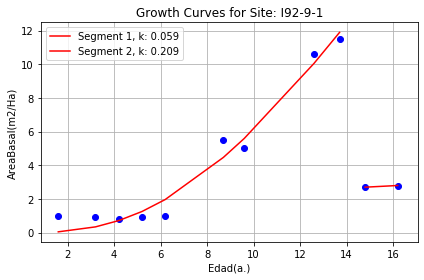

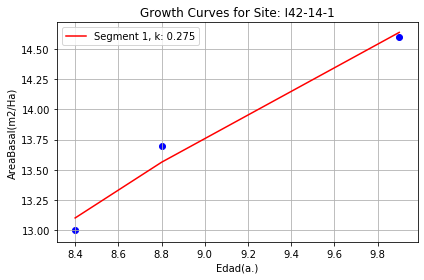

Failed to fit curve for site I42-12-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


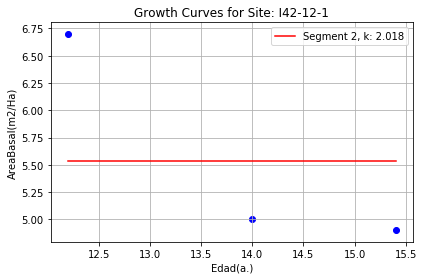

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


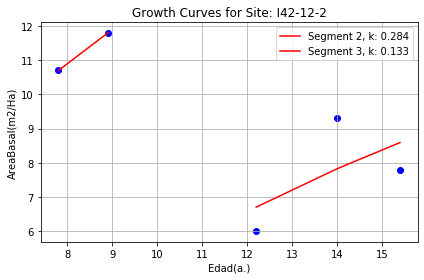

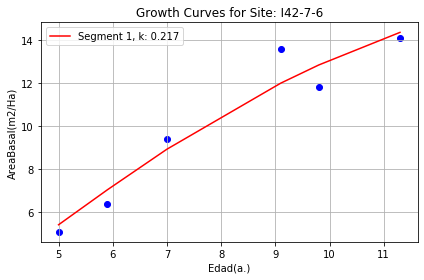

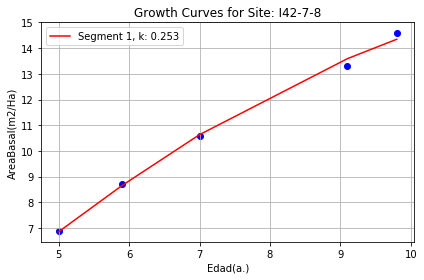

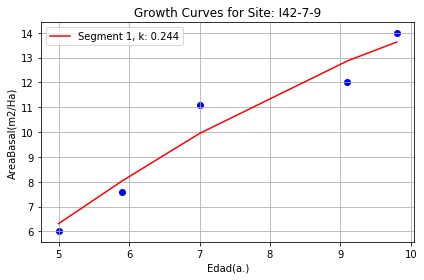

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


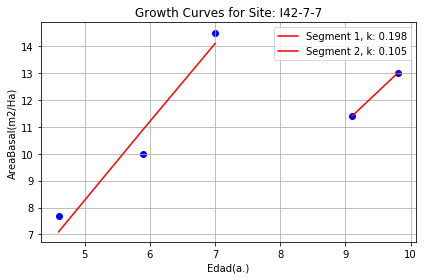

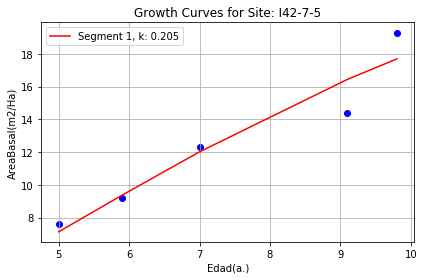

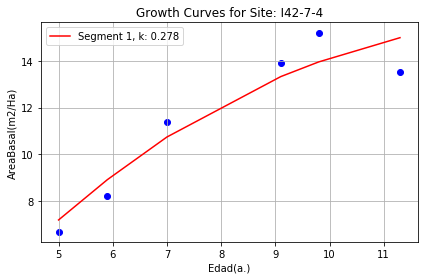

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


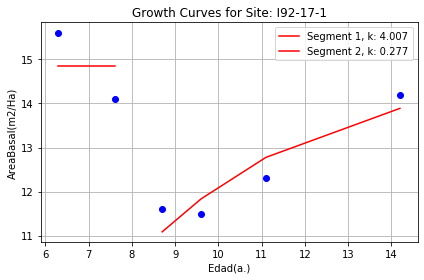

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


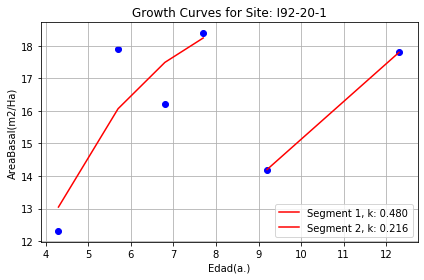

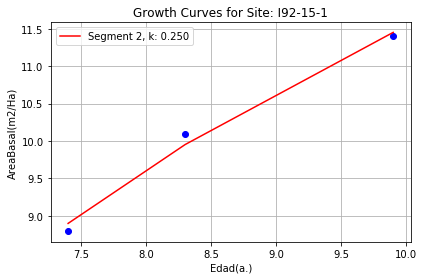

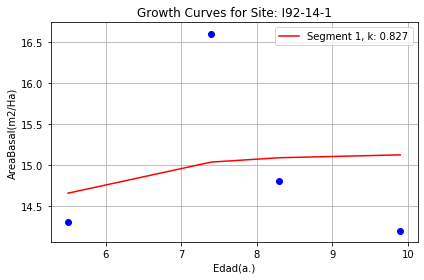

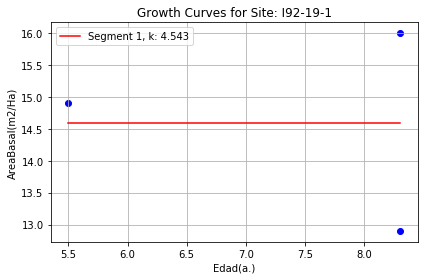

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


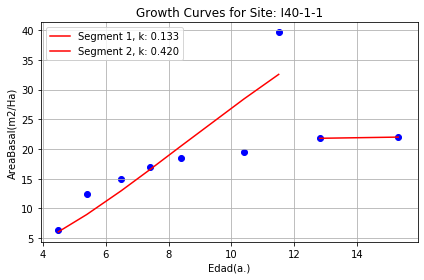

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


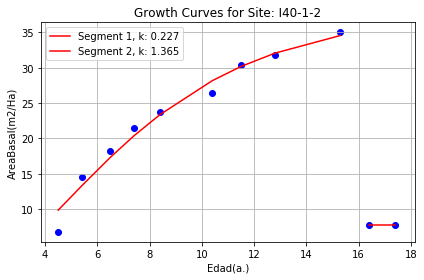

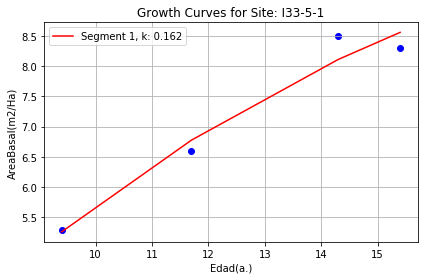

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


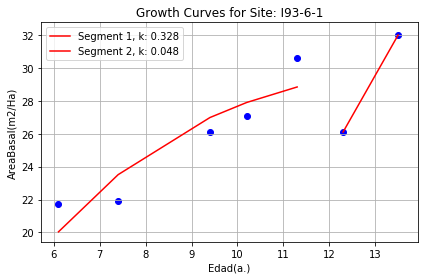

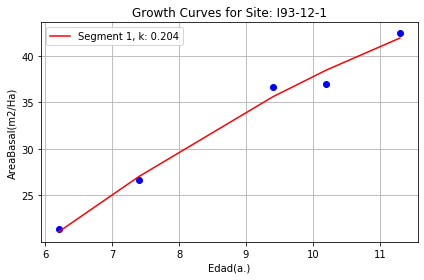

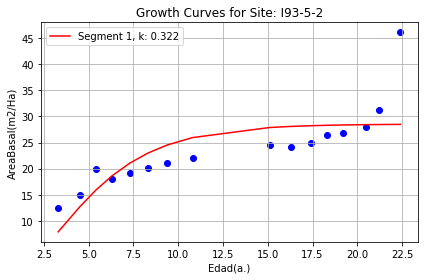

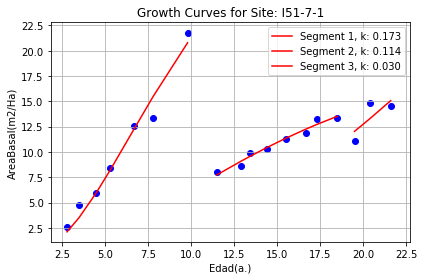

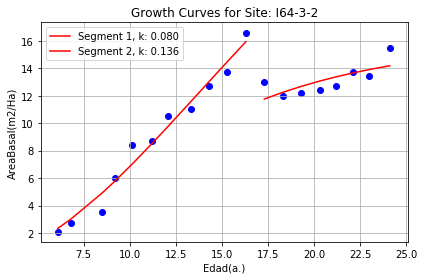

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


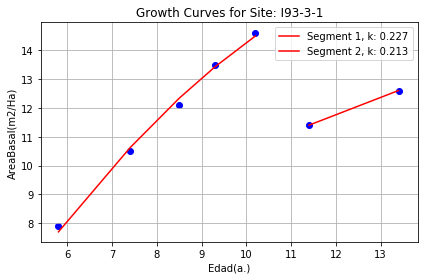

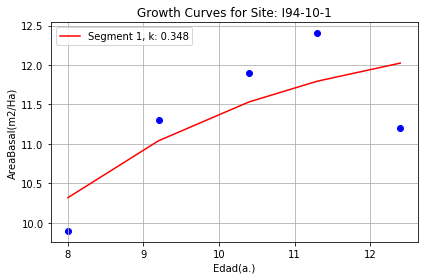

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


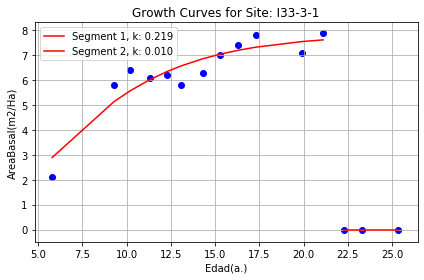

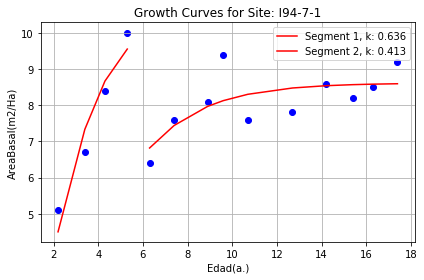

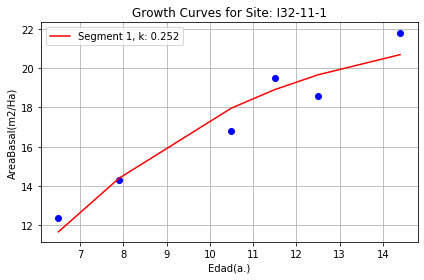

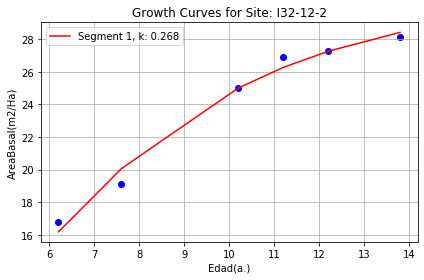

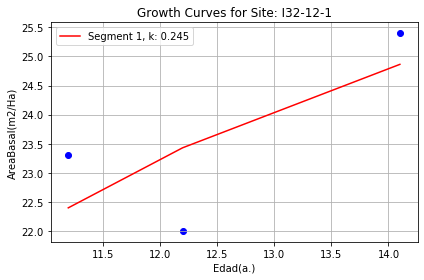

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


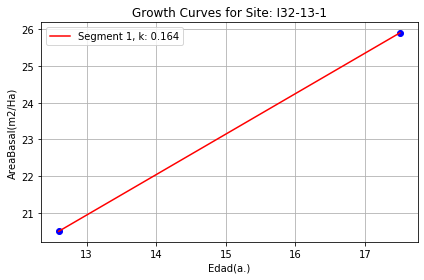

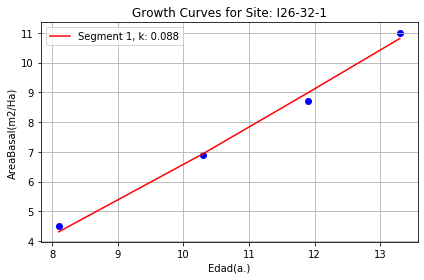

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


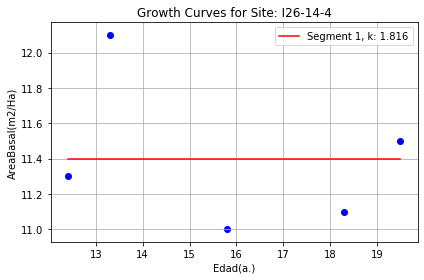

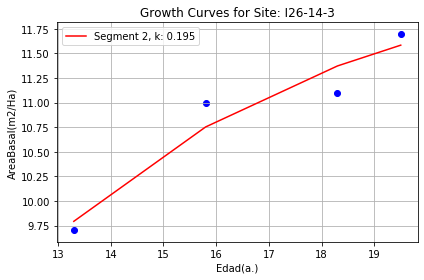

No handles with labels found to put in legend.


Failed to fit curve for site I26-14-1, segment 2. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


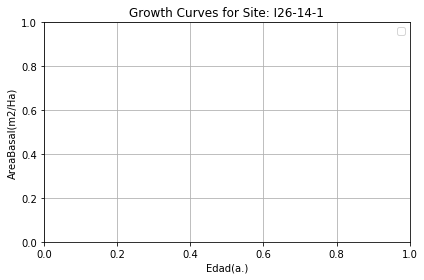

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


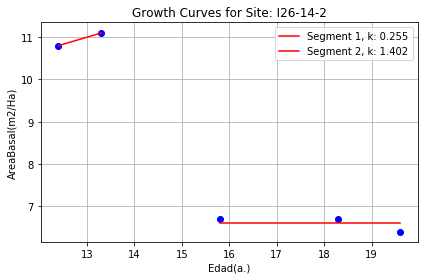

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


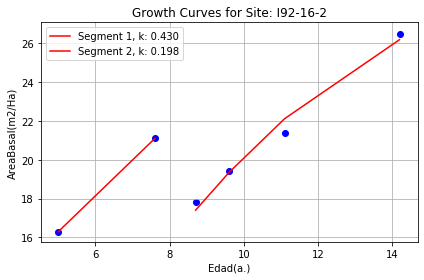

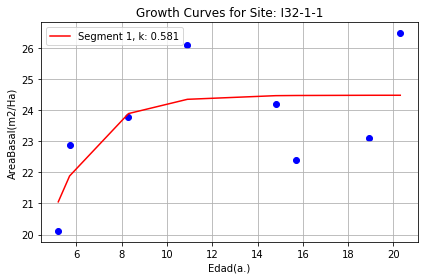

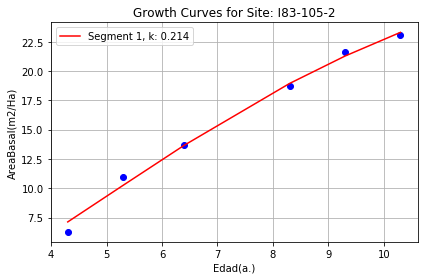

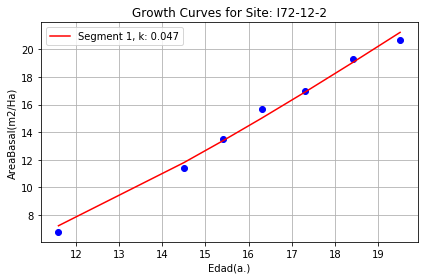

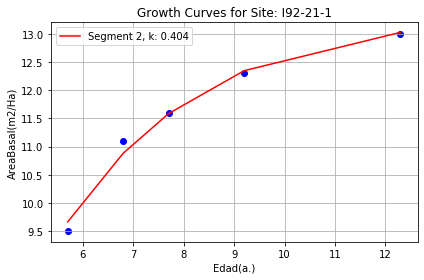

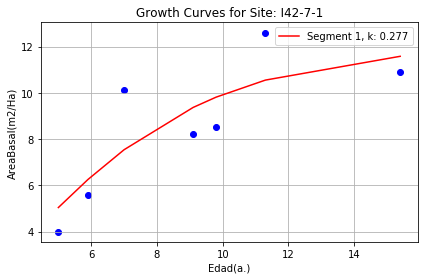

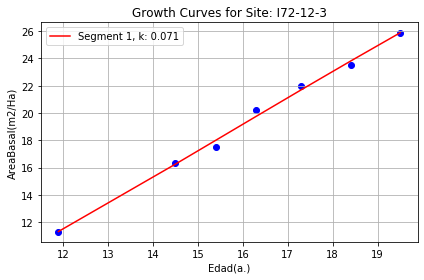

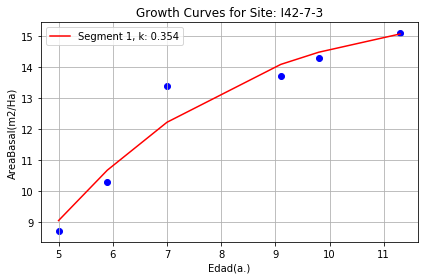

No handles with labels found to put in legend.


Failed to fit curve for site I42-7-2, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


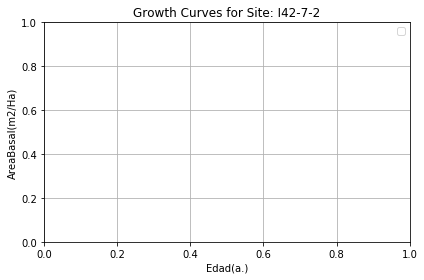

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app
No handles with labels found to put in legend.


Failed to fit curve for site I72-12-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


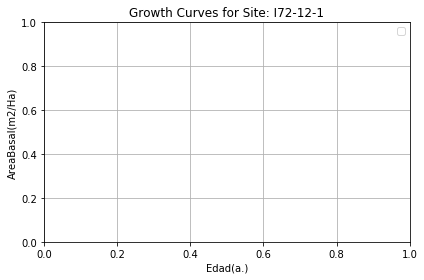

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


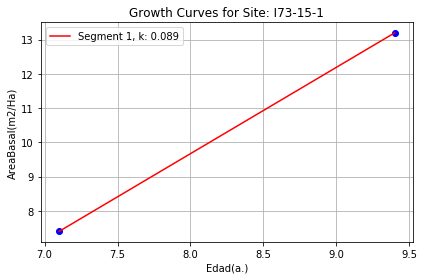

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


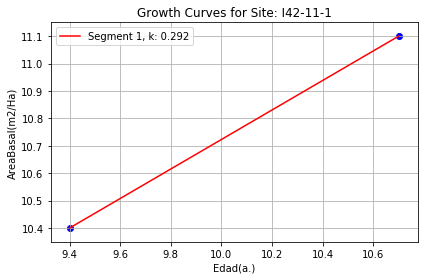

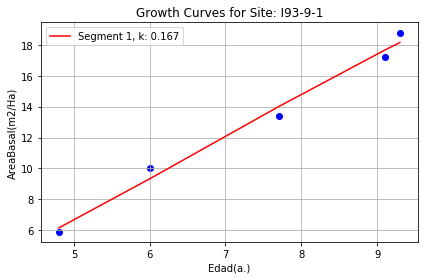

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


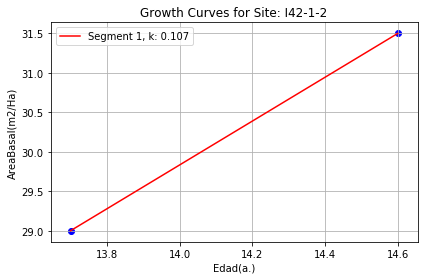

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


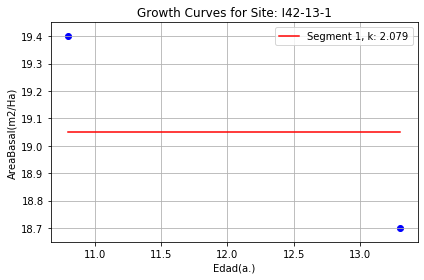

No handles with labels found to put in legend.


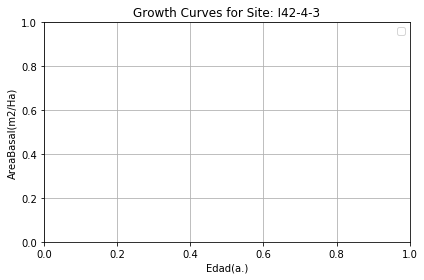

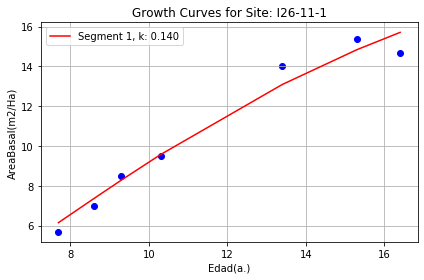

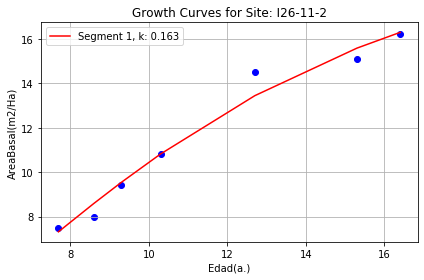

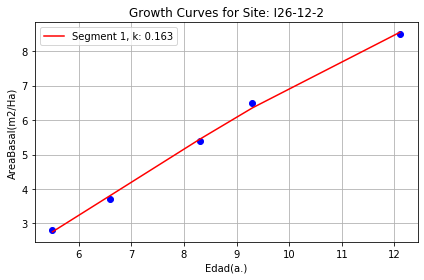

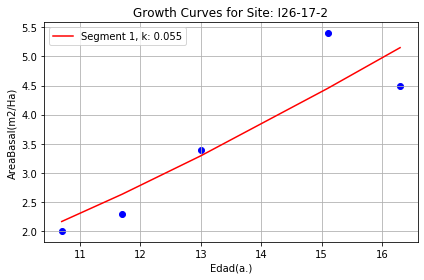

...

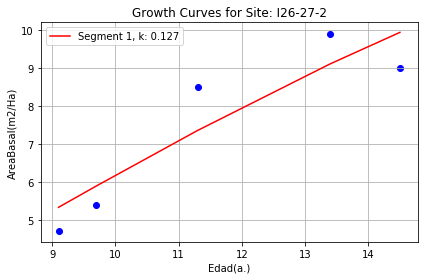

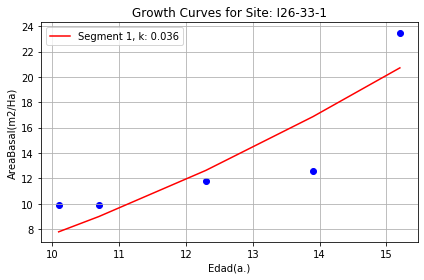

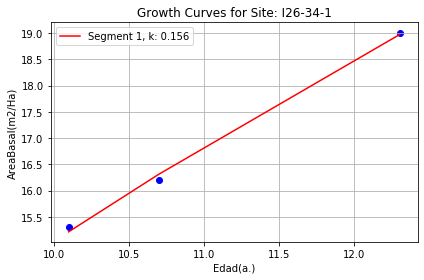

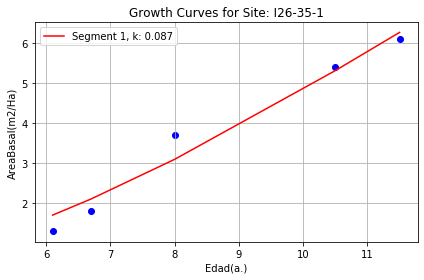

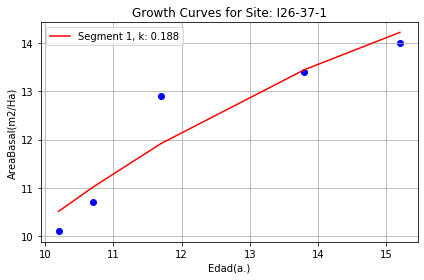

C:\Users\dinol\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in power
  from ipykernel import kernelapp as app
No handles with labels found to put in legend.


Failed to fit curve for site I26-7-1, segment 1. Error: Optimal parameters not found: Number of calls to function has reached maxfev = 600.


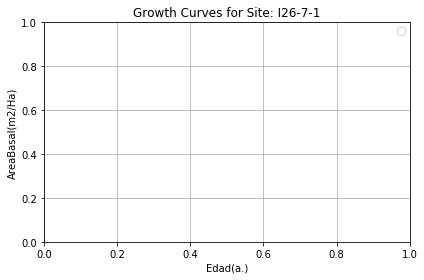

C:\Users\dinol\anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


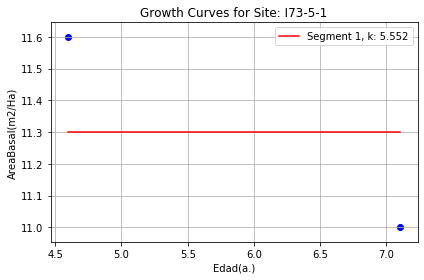

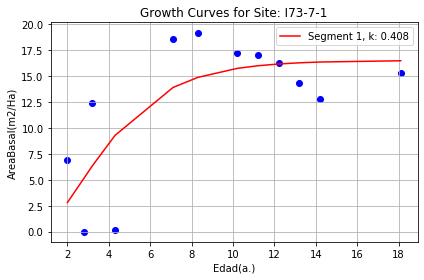

In [14]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def generate_growth_curve_plots(data):
    data['AreaBasal(m2/Ha)'].replace({"--": np.nan, "***.*": np.nan}, inplace=True)
    data = data.dropna(subset=['AreaBasal(m2/Ha)'])
    data['AreaBasal(m2/Ha)'] = data['AreaBasal(m2/Ha)'].astype(float)

    def growth_curve(t, k, A):
        m = 0.67  # fixed value
        b = 1  # fixed value
        return A * (1 - b * np.exp(-k * t))**(1 / (1 - m))

    unique_sites = data['codigoparc'].unique()

    output_directory = 'segments_site_plots'
    os.makedirs(output_directory, exist_ok=True)
    records = []

    for site in unique_sites:
        df_site = data[data['codigoparc'] == site]
        species = df_site['Especie'].unique()[0]

        segments = []
        t_values = []
        y_values = []
        start_y = None

        for _, row in df_site.iterrows():
            current_y = row['AreaBasal(m2/Ha)']
            if start_y is None:
                start_y = current_y

            if current_y < start_y and (start_y - current_y) > 2:
                if t_values:
                    segments.append((t_values, y_values))
                t_values = []
                y_values = []

            t_values.append(row['Edad(a.)'])
            y_values.append(current_y)
            start_y = current_y

        if t_values:
            segments.append((t_values, y_values))

        k_values = []
        plt.figure()

        for index, (t_seg, y_seg) in enumerate(segments):
            if len(t_seg) < 2:
                continue

            t_seg_array = np.array(t_seg)
            y_seg_array = np.array(y_seg)

            initial_guess = [0.01, max(y_seg)]  # Using a smaller initial guess for k and max value for A
            try:
                params, _ = curve_fit(growth_curve, t_seg_array, y_seg_array, p0=initial_guess)
                k, A = params
                k_values.append(k)

                plt.scatter(t_seg, y_seg, c='blue', marker='o')
                t_sorted = np.sort(t_seg_array)
                plt.plot(t_sorted, growth_curve(t_sorted, k, A), label=f'Segment {index+1}, k: {k:.3f}', color='red')
            except Exception as e:
                print(f"Failed to fit curve for site {site}, segment {index+1}. Error: {e}")
                continue

        record = {
            "codigoparc": site,
            "X": df_site['X'].unique()[0],
            "Y": df_site['Y'].unique()[0],
            "Especie": species
        }

        for i, k_val in enumerate(k_values):
            record[f'k{i+1}'] = k_val

        records.append(record)

        plt.xlabel('Edad(a.)')
        plt.ylabel('AreaBasal(m2/Ha)')
        plt.title(f'Growth Curves for Site: {site}')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        output_filename = os.path.join(output_directory, f'growth_curve_{site}.png')
        plt.savefig(output_filename)
        plt.show()

    df_records = pd.DataFrame(records)
    df_records.to_csv("segments_site_k_values.csv", index=False)

generate_growth_curve_plots(data)


## Plot by Especie

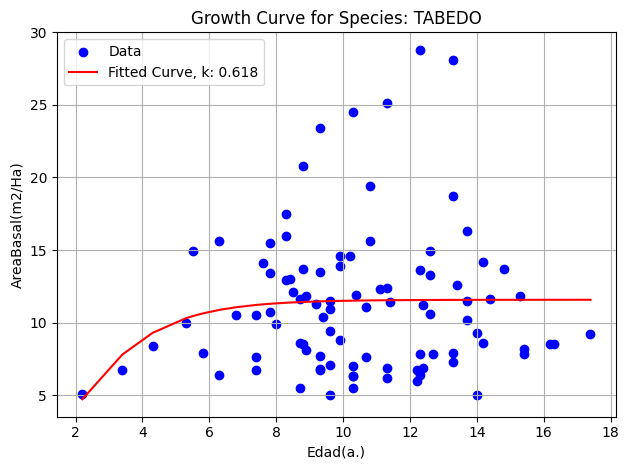

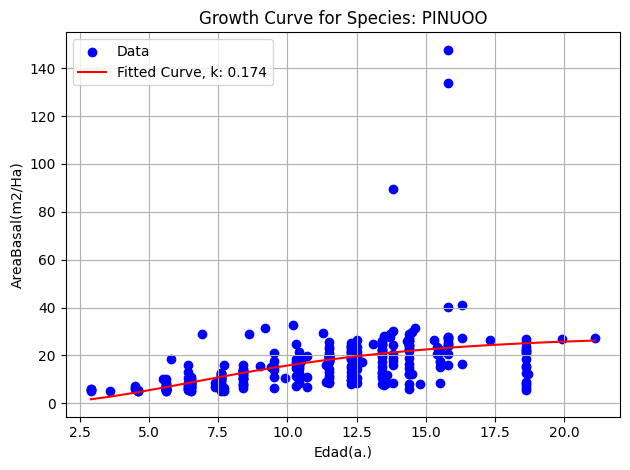

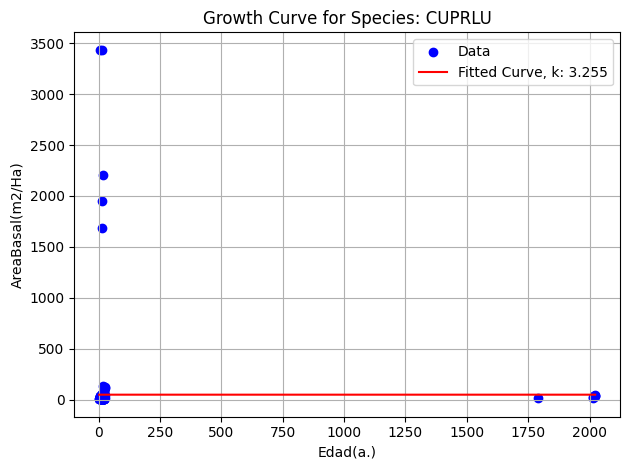

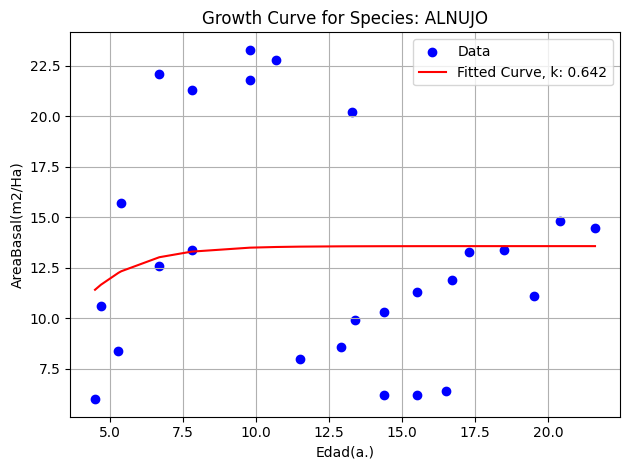

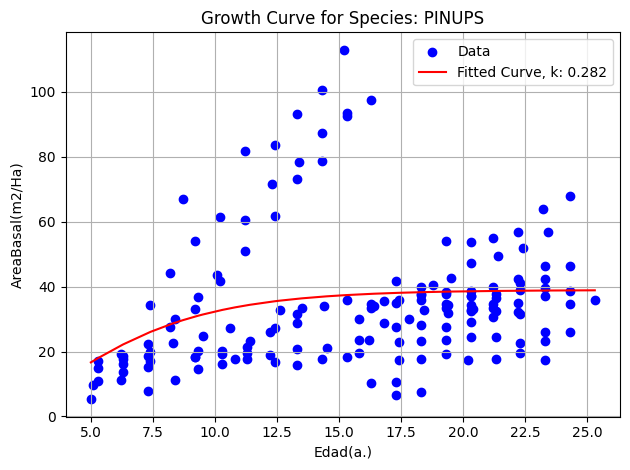

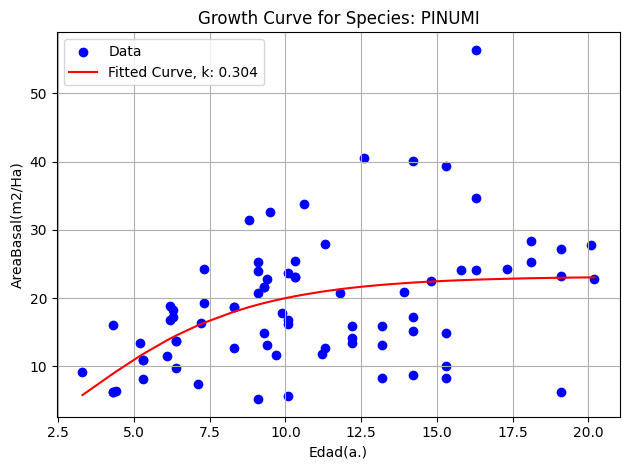

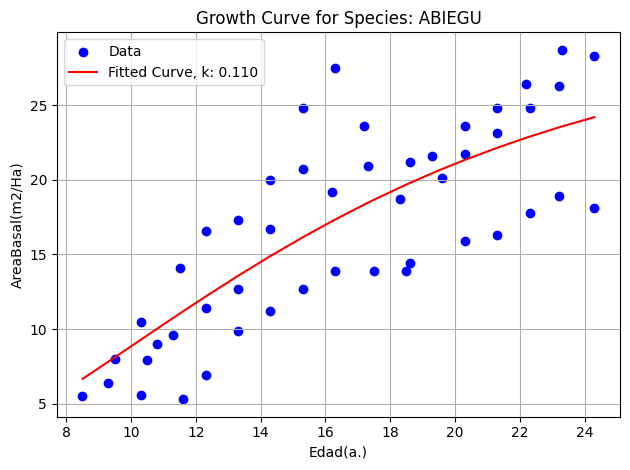

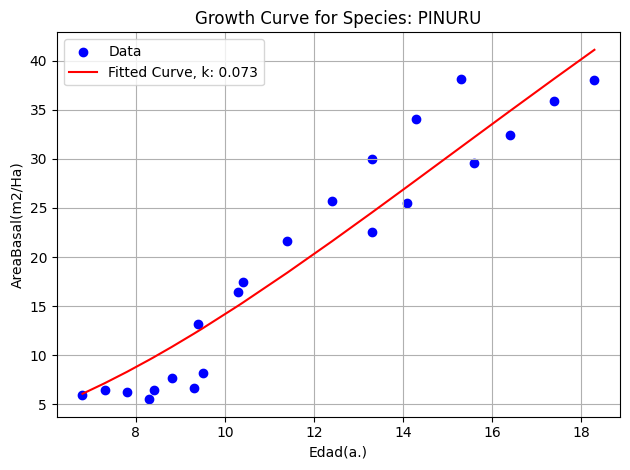

Failed to fit curve for species MIXTAS*. Error: [Errno 22] Invalid argument: 'species_plots\\growth_curve_MIXTAS*.png'


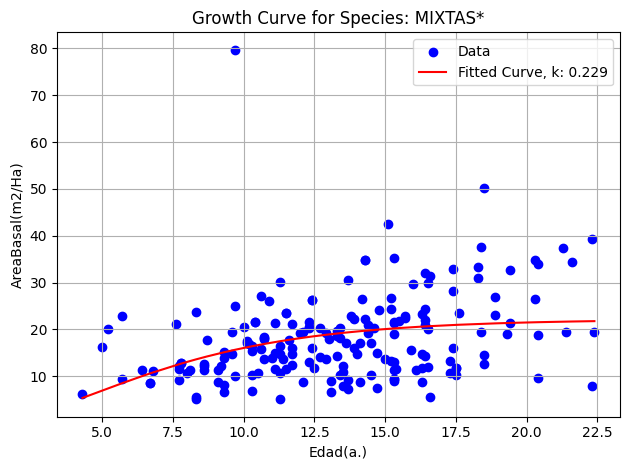

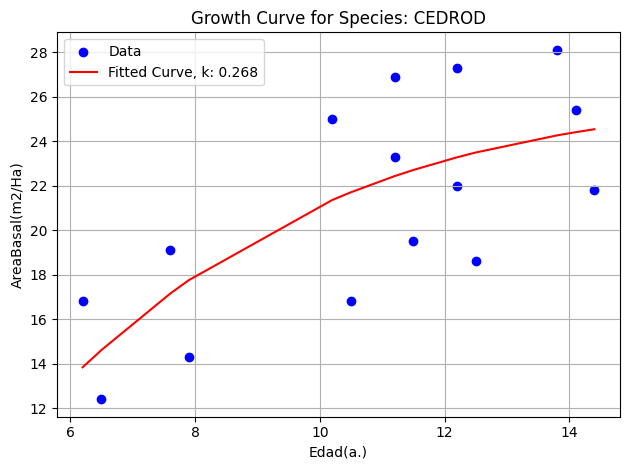

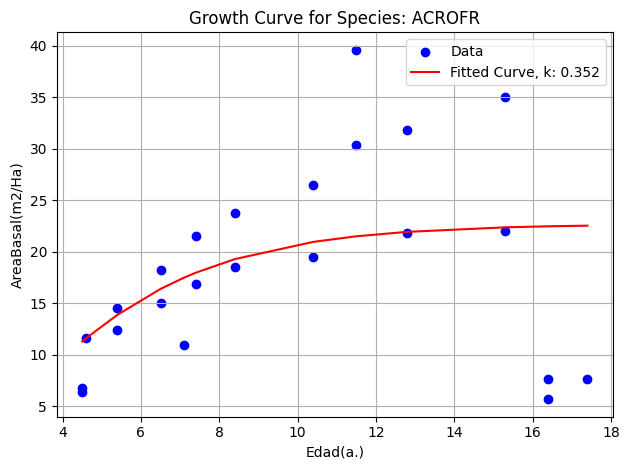

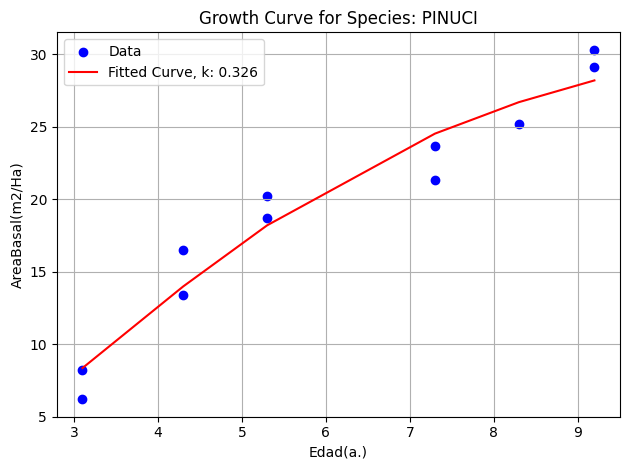

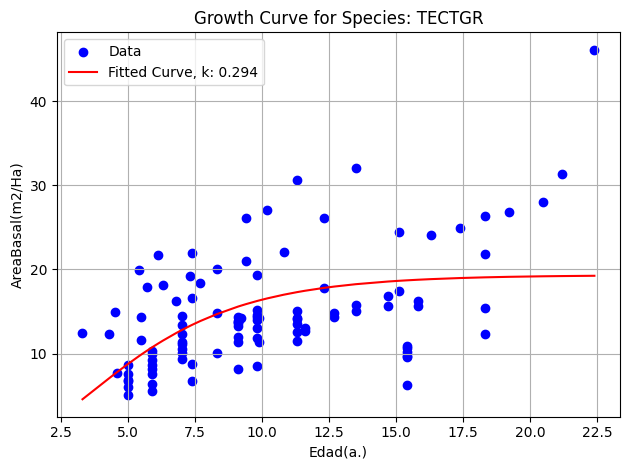

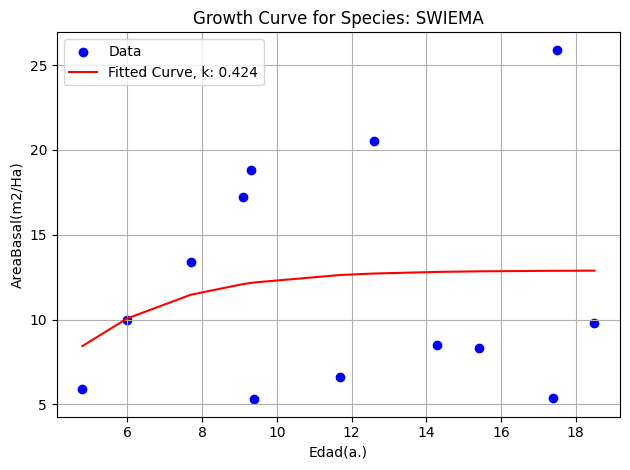

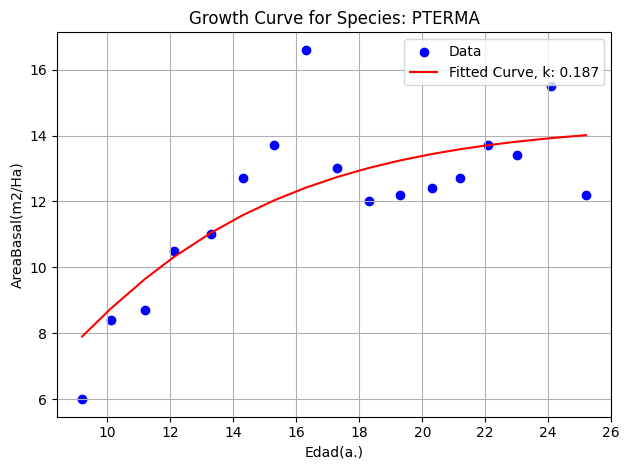

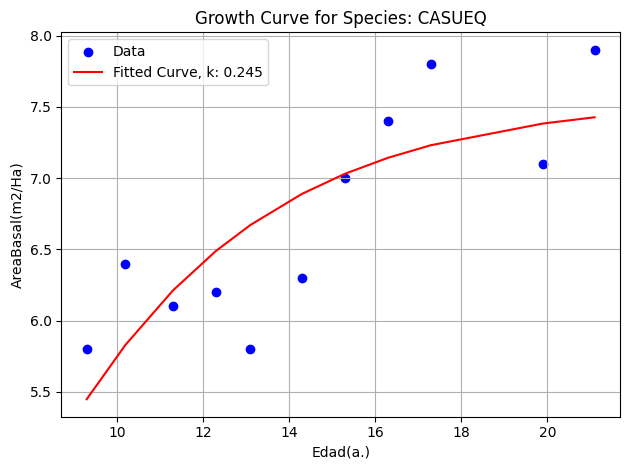

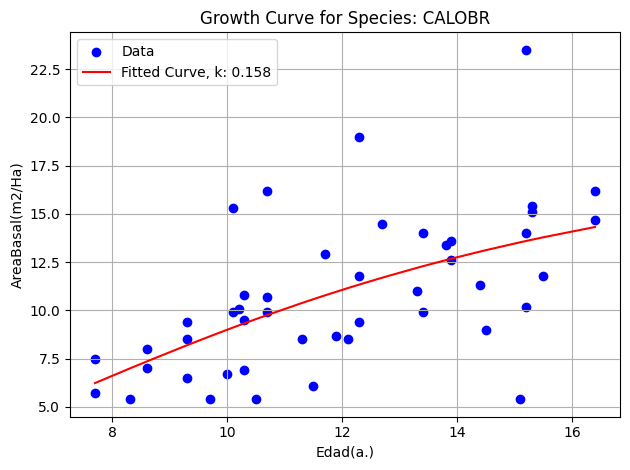

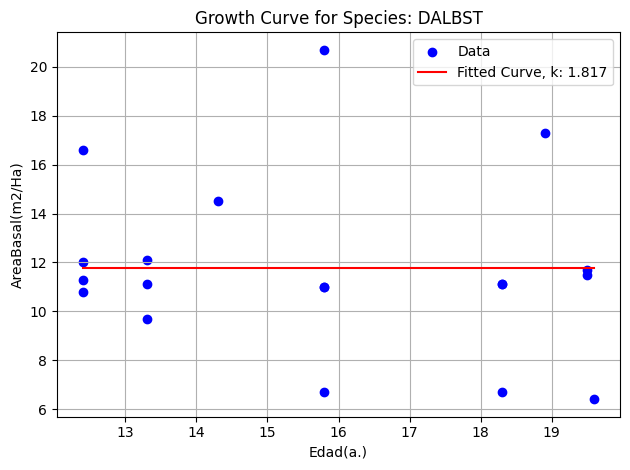

In [38]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

data['AreaBasal(m2/Ha)'].replace({"--": np.nan, "***.*": np.nan}, inplace=True)
data = data.dropna(subset=['AreaBasal(m2/Ha)'])
data['AreaBasal(m2/Ha)'] = data['AreaBasal(m2/Ha)'].astype(float)

def growth_curve(t, k, A):
    m = 0.67  # fixed value
    b = 1  # fixed value
    return A * (1 - b * np.exp(-k * t))**(1 / (1 - m))

unique_species = data['Especie'].unique()

output_directory = 'species_plots'
os.makedirs(output_directory, exist_ok=True)

records = []

for species in unique_species:
    df_species = data[data['Especie'] == species]
    
    df_species.loc[df_species['Especie'] == 'MIXTAS*', 'Especie'] = 'MIXTAS#'
    df_species_sorted = df_species.sort_values(by="AreaBasal(m2/Ha)", ascending=False).copy()
    if len(df_species_sorted) > 1 and df_species_sorted.iloc[0, df_species_sorted.columns.get_loc("AreaBasal(m2/Ha)")] > 2 * df_species_sorted.iloc[1, df_species_sorted.columns.get_loc("AreaBasal(m2/Ha)")]:
        df_species = df_species[df_species['AreaBasal(m2/Ha)'] != df_species_sorted.iloc[0, df_species_sorted.columns.get_loc("AreaBasal(m2/Ha)")]]

    df_species = df_species[df_species['AreaBasal(m2/Ha)'] != 0]
    df_species = df_species[df_species['Edad(a.)'] != 0]
    df_species = df_species[df_species['AreaBasal(m2/Ha)'] >= 5]

    if df_species['AreaBasal(m2/Ha)'].nunique() == 1 or df_species.shape[0] < 10:
        continue

    t = df_species['Edad(a.)'].values
    y = df_species['AreaBasal(m2/Ha)'].values

    initial_guess = [0.01, max(y)]
    try:
        params, _ = curve_fit(growth_curve, t, y, p0=initial_guess)
        k, A = params

        record = {
            "Especie": species,
            "k": k,
            "A": A
        }

        records.append(record)

        plt.figure()
        plt.scatter(t, y, label='Data', c='blue', marker='o')
        t_sorted = np.sort(t)
        plt.plot(t_sorted, growth_curve(t_sorted, k, A), label=f'Fitted Curve, k: {k:.3f}', color='red')
        plt.xlabel('Edad(a.)')
        plt.ylabel('AreaBasal(m2/Ha)')
        plt.title(f'Growth Curve for Species: {species}')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()

        output_filename = os.path.join(output_directory, f'growth_curve_{species}.png')
        plt.savefig(output_filename)
        plt.show()

    except Exception as e:
        print(f"Failed to fit curve for species {species}. Error: {e}")
        continue

df_records = pd.DataFrame(records)
df_records.to_csv("species_k_values.csv", index=False)


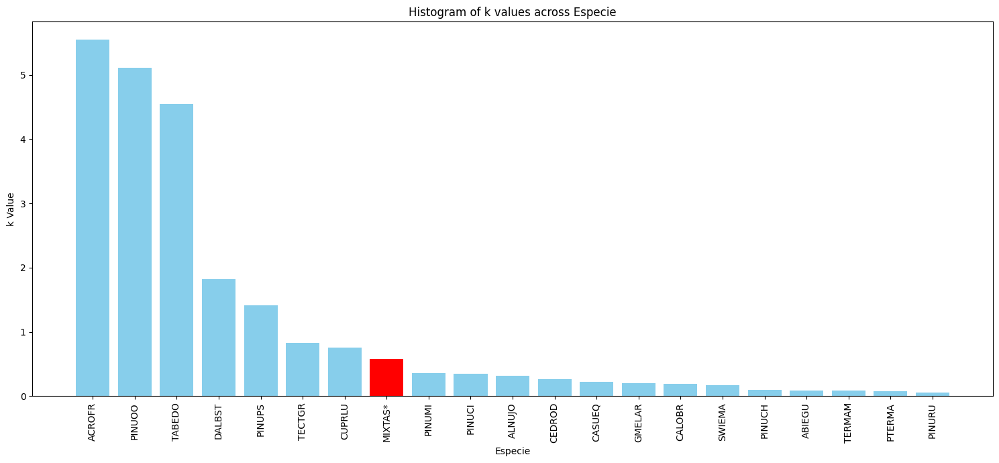

In [43]:
df_rank = pd.read_csv(r"./segments_site_k_values.csv")
sorted_df = df_rank.sort_values(by="k1", ascending=False)

colors = ['red' if specie == 'MIXTAS*' else 'skyblue' for specie in sorted_df["Especie"]]

plt.figure(figsize=(15, 7))
plt.bar(sorted_df["Especie"], sorted_df["k1"], color=colors)
plt.ylabel('k Value')
plt.xlabel('Especie')
plt.title('Histogram of k values across Especie')
plt.xticks(rotation=90) 
plt.tight_layout()
plt.show()


In [67]:
df_rank['Especie'].unique()

array(['TABEDO', 'PINUOO', 'CUPRLU', 'ALNUJO', 'PINUPS', 'PINUMI',
       'ABIEGU', 'PINURU', 'PINUCH', 'MIXTAS*', 'PINUCI', 'TECTGR',
       'ACROFR', 'SWIEMA', 'GMELAR', 'PTERMA', 'CASUEQ', 'CEDROD',
       'CALOBR', 'DALBST', 'TERMAM'], dtype=object)

## regression and tree

In [85]:
df_cate= pd.read_csv("segments_site_k_values.csv")

cols_to_retrieve = ['tipo_espec', 'leaf_phenology', 'leaf_type', 'wood_type', 'endemism', 'n_fixer', 
           'land_cover_class_2020',  'zonadevida', 'clasetextu', 'nombretecn', 'tipopropie', 'endemism']

for index, row in df_cate.iterrows():
    species_row = data[(data['Especie'] == row['Especie']) & (data['codigoparc'] == row['codigoparc'])]
    
    if not species_row.empty:
        for col in cols_to_retrieve:
            df_cate.at[index, col] = species_row[col].iloc[0]

df_cate.columns


Index(['codigoparc', 'X', 'Y', 'Especie', 'k1', 'k2', 'k3', 'k4', 'tipo_espec',
       'leaf_phenology', 'leaf_type', 'wood_type', 'endemism', 'n_fixer',
       'land_cover_class_2020', 'zonadevida', 'clasetextu', 'nombretecn',
       'tipopropie'],
      dtype='object')

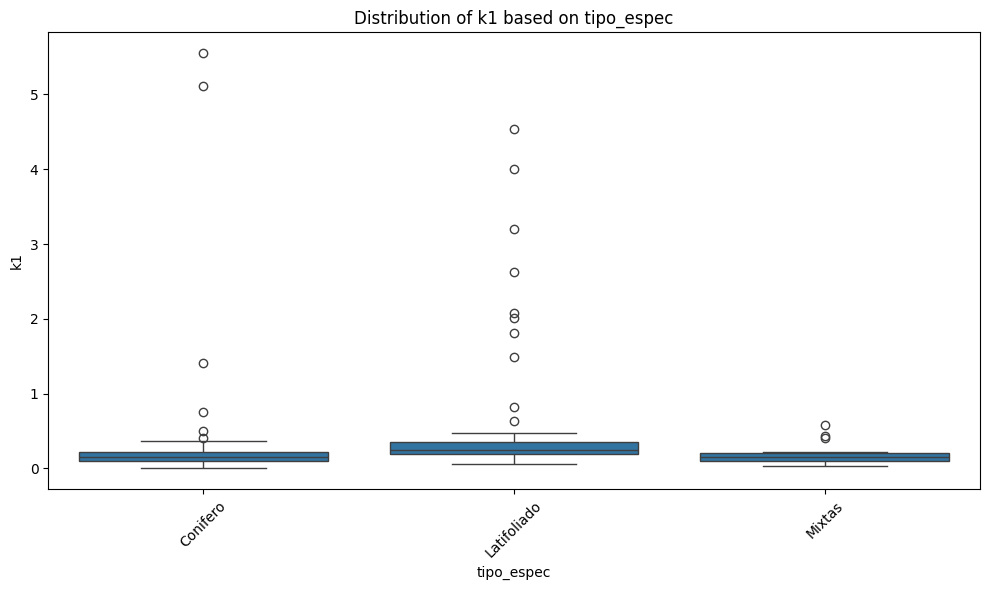

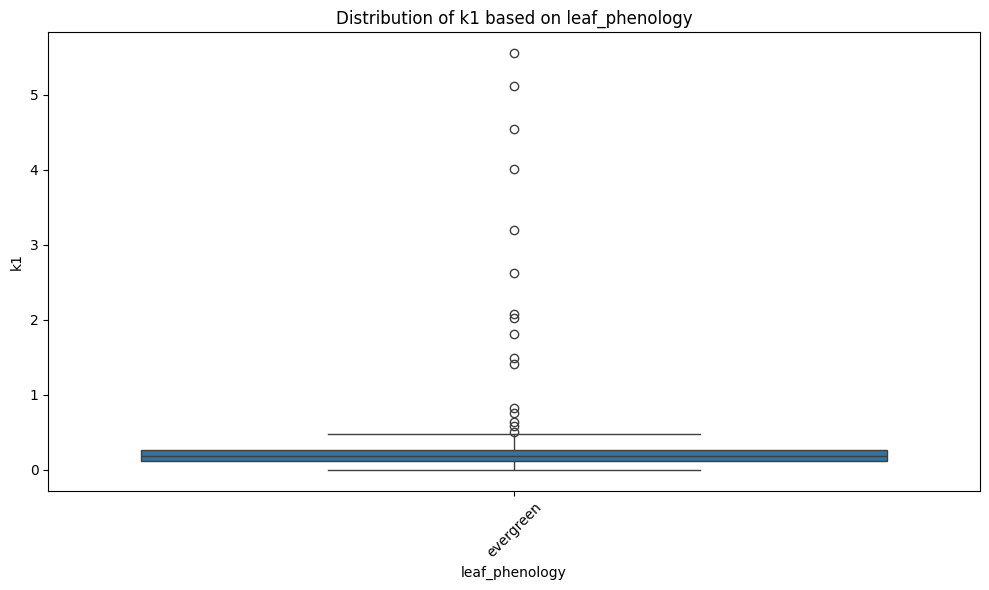

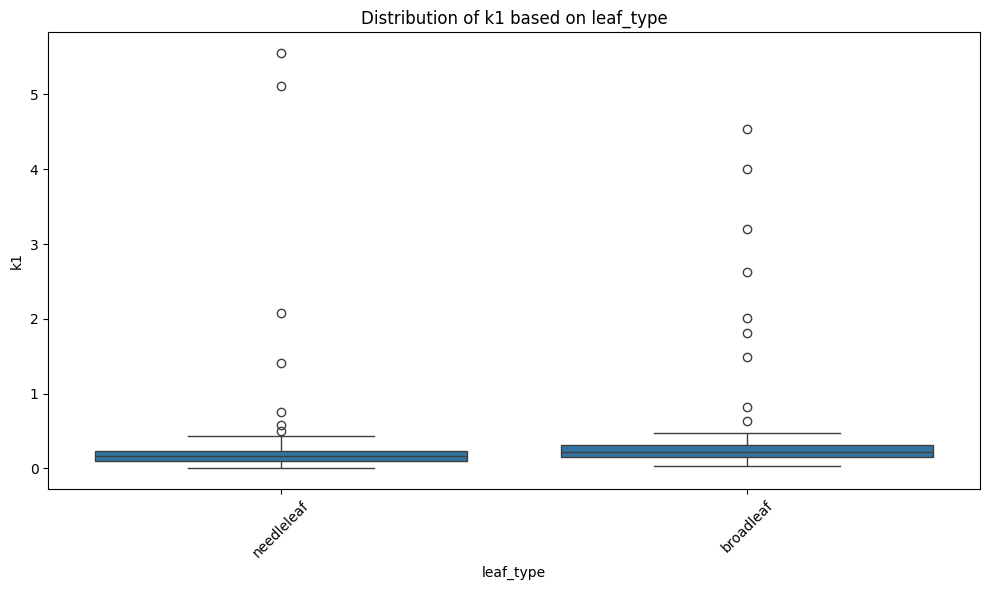

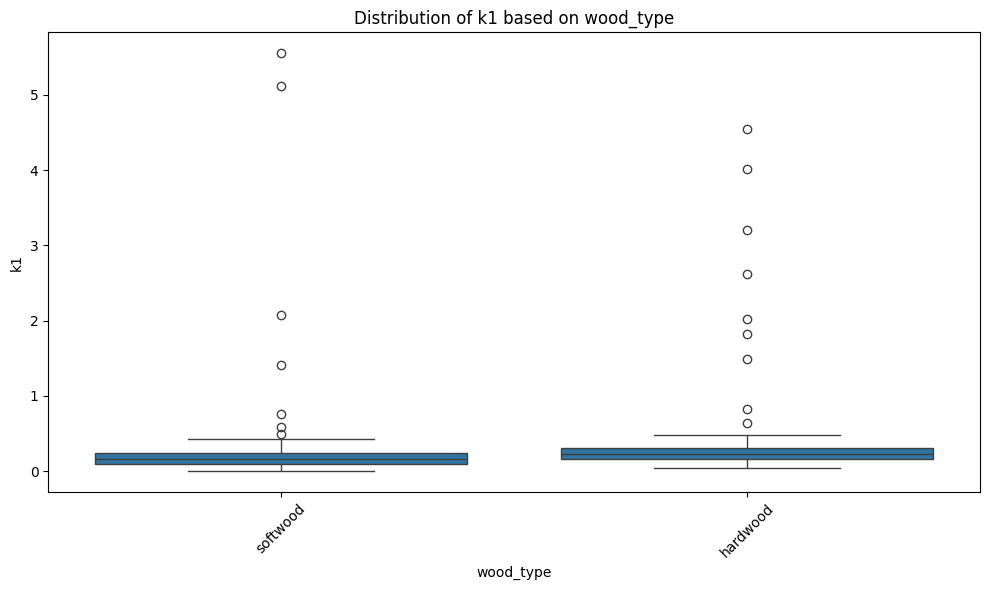

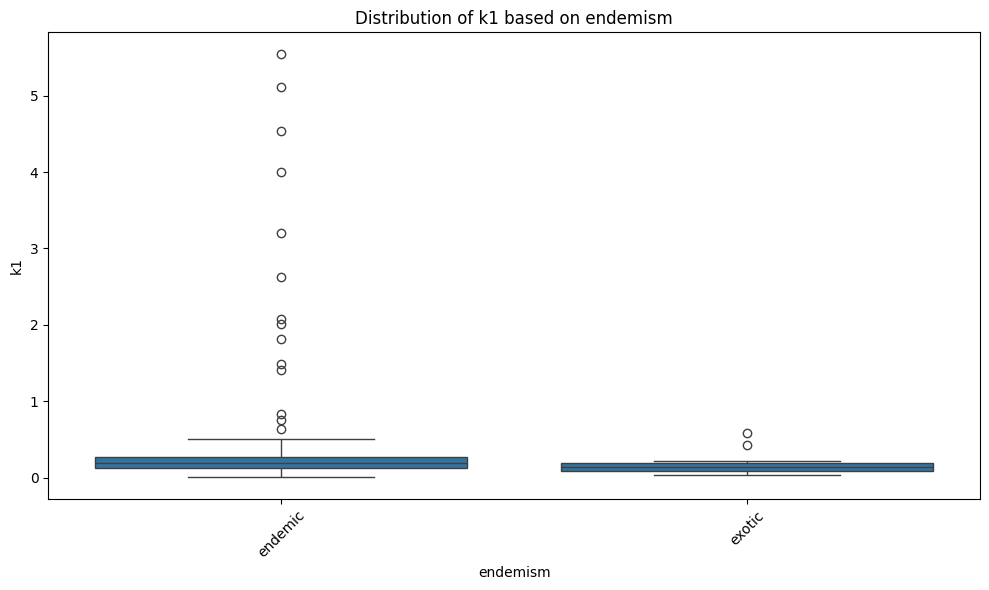

...

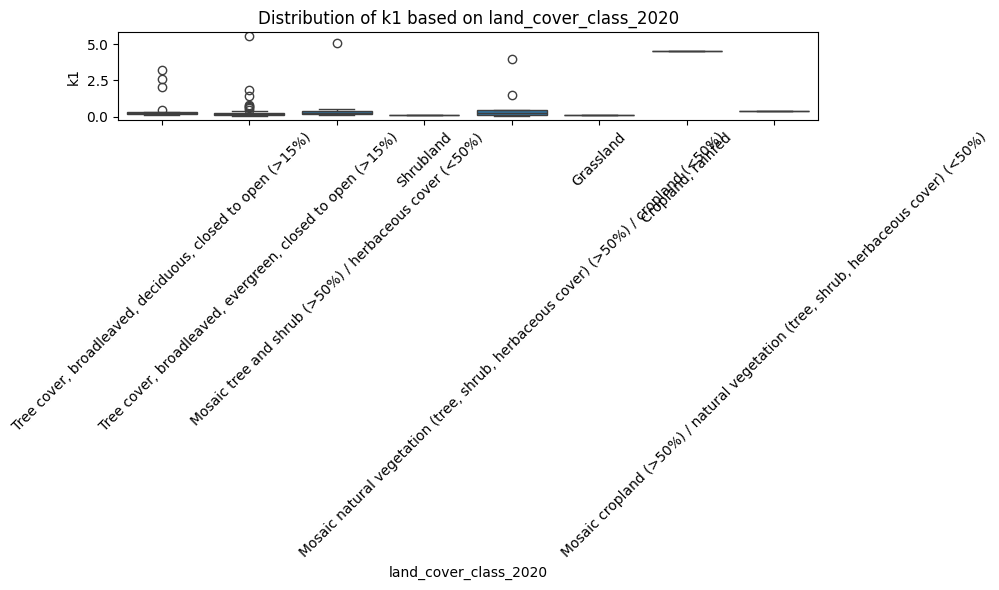

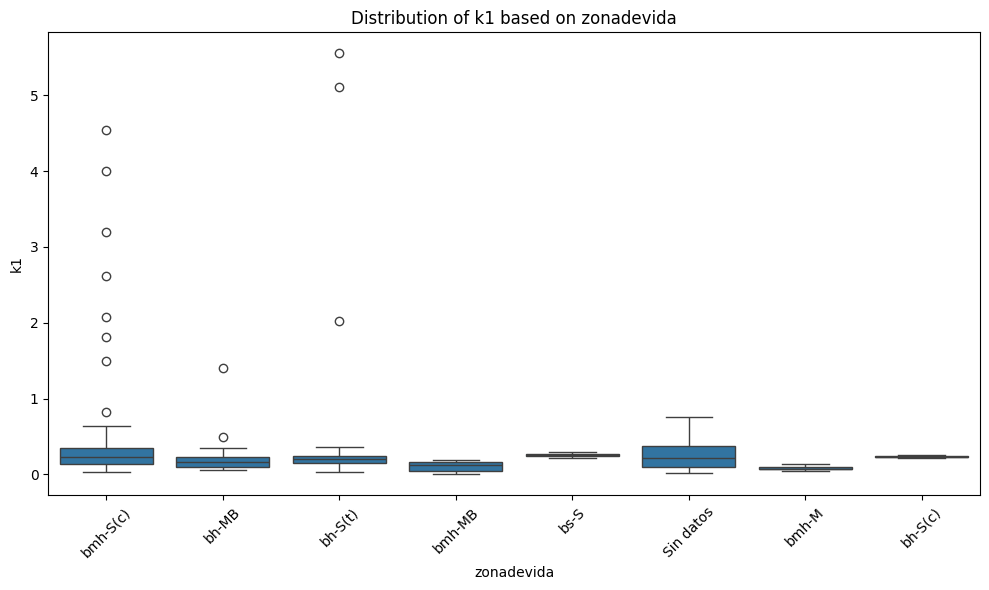

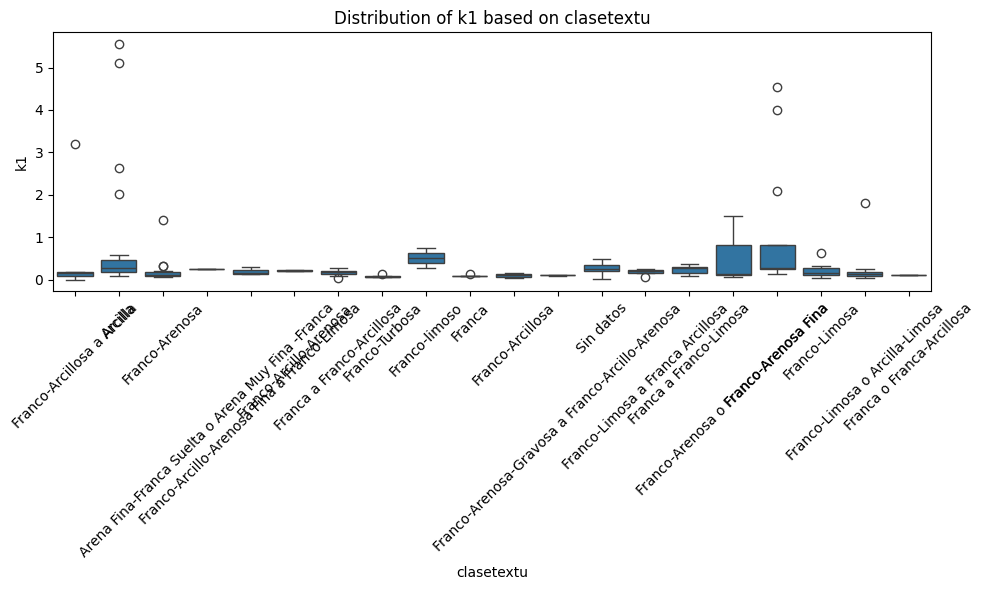

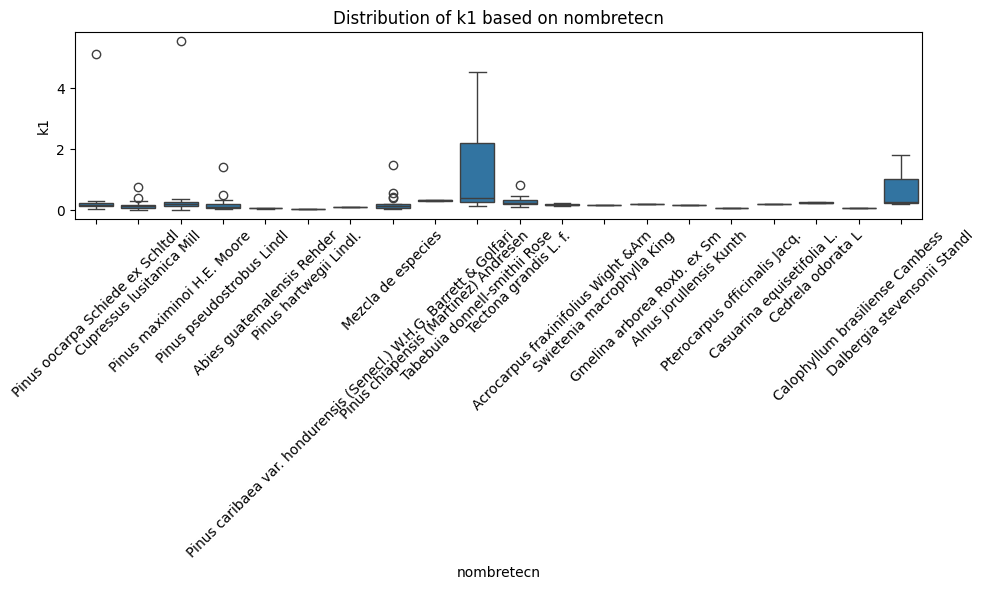

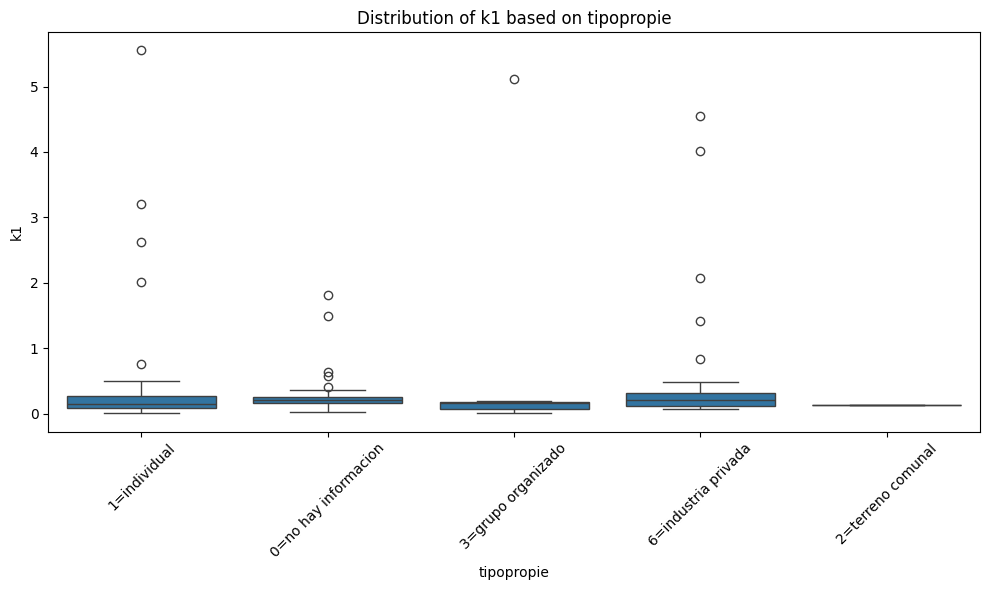

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

category_columns = ['tipo_espec', 'leaf_phenology', 'leaf_type', 'wood_type', 'endemism', 'n_fixer', 
                    'land_cover_class_2020', 'zonadevida', 'clasetextu', 'nombretecn', 'tipopropie']

for col in category_columns:
    plt.figure(figsize=(10,6))
    sns.boxplot(x=col, y='k1', data=df_cate)
    plt.title(f"Distribution of k1 based on {col}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


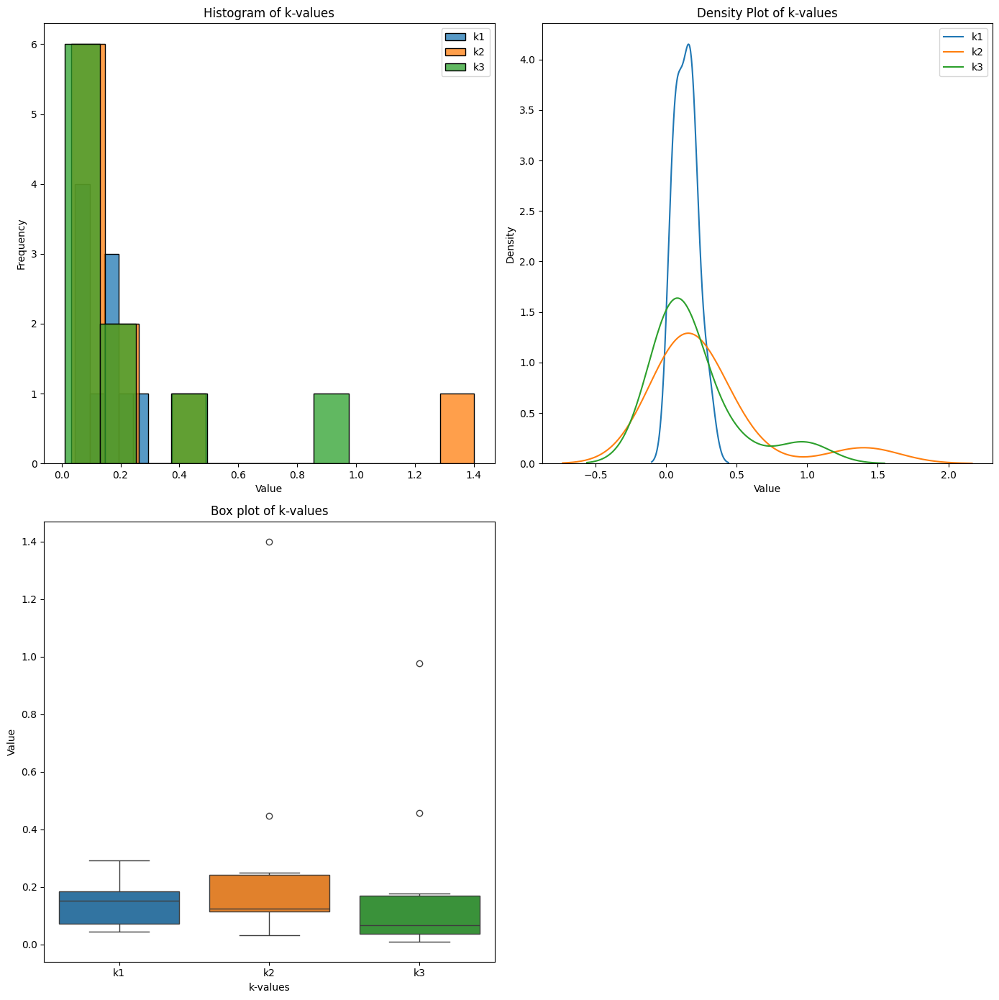

In [251]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

if not os.path.exists('species_plots'):
    os.makedirs('species_plots')
df_cate=pd.read_csv("segments_site_k_values.csv")
df_cate=df_cate[['k1','k2', 'k3']]
df_cate = df_cate.dropna(subset=['k2', 'k3'])
fig = plt.figure(figsize=(14, 14))

ax1 = fig.add_subplot(2, 2, 1)
for k in ['k1', 'k2', 'k3']:
    sns.histplot(df_cate[k], kde=False, ax=ax1, label=k)
ax1.set_title('Histogram of k-values')
ax1.set_xlabel('Value')
ax1.set_ylabel('Frequency')
ax1.legend()

ax2 = fig.add_subplot(2, 2, 2)
for k in ['k1', 'k2', 'k3']:
    sns.kdeplot(df_cate[k], ax=ax2, label=k)
ax2.set_title('Density Plot of k-values')
ax2.set_xlabel('Value')
ax2.set_ylabel('Density')
ax2.legend()
ax3 = fig.add_subplot(2, 2, 3)
sns.boxplot(data=df_cate[['k1', 'k2', 'k3']], ax=ax3)
ax3.set_title('Box plot of k-values')
ax3.set_xlabel('k-values')
ax3.set_ylabel('Value')
fig.tight_layout()
plt.savefig('species_plots/combined_plots_triangle.png')


In [210]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

df_records = pd.read_csv("segments_site_k_values.csv")
df_records = df_records.drop(columns=['k2', 'k3', 'k4'])

cols_to_retrieve = [
    'meanAnnualPrecip',
    'soil_moisture.Soil_Moisture_Retrieval_Data_PM',
    'tipo_espec', 
    'leaf_type',
    'wood_type',
    'tipopropie', 
    'endemism', 
    'leaf_phenology',  
    'n_fixer', 
    'zonadevida'
]

for index, row in df_records.iterrows():
    species_row = data[(data['Especie'] == row['Especie']) & (data['codigoparc'] == row['codigoparc'])]
    if not species_row.empty:
        for col in cols_to_retrieve:
            df_records.at[index, col] = species_row[col].iloc[0]

df_records.rename(columns={'soil_moisture.Soil_Moisture_Retrieval_Data_PM': 'soil moisture'}, inplace=True)
df_records.rename(columns={'meanAnnualPrecip': 'Mean Annual Precipitation'}, inplace=True)

label_encoders = {}
for col in [
    'tipo_espec', 'leaf_type', 'wood_type', 'endemism', 'leaf_phenology',  'n_fixer'
]:
    le = LabelEncoder()
    df_records[col] = le.fit_transform(df_records[col])
    label_encoders[col] = le

for col in ['zonadevida', 'tipopropie']:
    le = LabelEncoder()
    df_records[f"{col}_encoded"] = le.fit_transform(df_records[col])
    label_encoders[col] = le

df_records.dropna(inplace=True)
df_records.drop(columns=['codigoparc', 'Especie', 'X', 'Y'], inplace=True)
df_records.to_csv("civ.csv", index=False)
df_records

,k1,Mean Annual Precipitation,soil moisture,tipo_espec,leaf_type,wood_type,tipopropie,endemism,leaf_phenology,n_fixer,zonadevida,zonadevida_encoded,tipopropie_encoded
0,0.150395,2021.0,0.176733,0,1,1,1=individual,0,0,0,bmh-S(c),6,1
1,0.243112,2046.0,0.156656,0,1,1,0=no hay informacion,0,0,0,bmh-S(c),6,0
2,0.119465,2046.0,0.156656,0,1,1,0=no hay informacion,0,0,0,bmh-S(c),6,0
3,0.164757,1435.0,0.167284,0,1,1,0=no hay informacion,0,0,0,bh-MB,1,0
4,0.316610,1388.0,0.167284,0,1,1,0=no hay informacion,0,0,0,bh-MB,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,0.156416,2993.0,0.248304,2,0,0,1=individual,1,0,0,bmh-S(c),6,1
161,0.086500,3191.0,0.284580,2,0,0,1=individual,1,0,0,bmh-S(c),6,1
162,0.187941,2993.0,0.248304,2,0,0,1=individual,1,0,0,bmh-S(c),6,1
163,5.551715,2268.0,0.371173,0,1,1,1=individual,0,0,0,bh-S(t),3,1


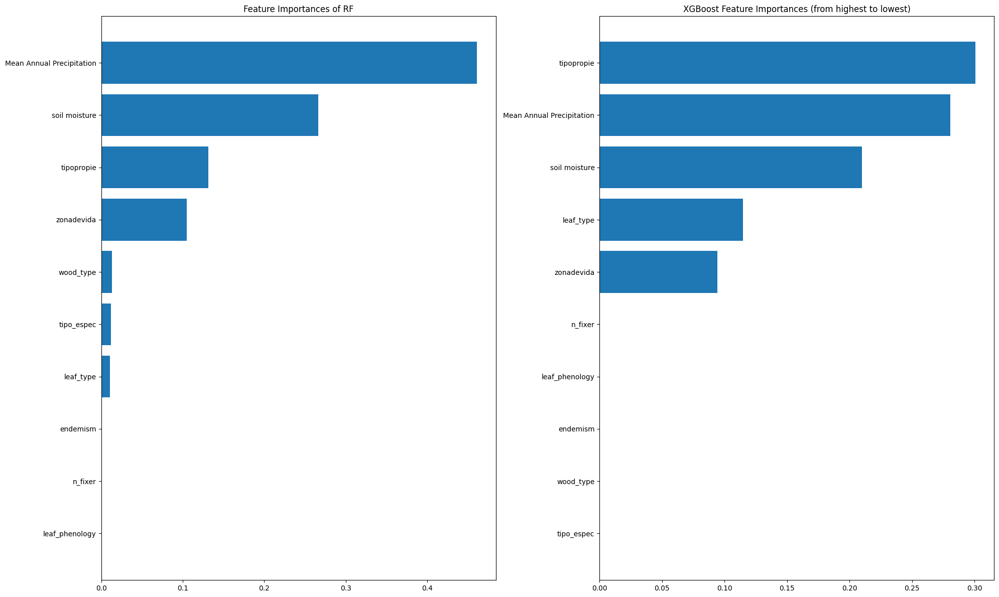

R^2 on test data (Random Forest): 0.0438
OOB Score: -0.1592
R^2 on test data (XGBoost): -0.3910


In [205]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import make_scorer, r2_score
import xgboost as xgb

df_records = pd.read_csv("civ.csv")

X = df_records.drop(columns='k1')  
y = df_records['k1']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=40)

rf = RandomForestRegressor(n_estimators=100, max_depth=3, oob_score=True, random_state=40)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

importances = rf.feature_importances_
sorted_idx_rf = np.argsort(importances)[::-1]

model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    max_depth=3,
    learning_rate=0.01
)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

feature_importances = model.feature_importances_
sorted_idx_xgb = feature_importances.argsort()

plt.figure(figsize=(20, 12))

plt.subplot(1, 2, 1)
plt.title("Feature Importances of RF")
plt.barh(range(X_train.shape[1]), importances[sorted_idx_rf], align="center")
plt.yticks(range(X_train.shape[1]), X_train.columns[sorted_idx_rf])
plt.gca().invert_yaxis()

plt.subplot(1, 2, 2)
plt.title("XGBoost Feature Importances (from highest to lowest)")
plt.barh(X.columns[sorted_idx_xgb], feature_importances[sorted_idx_xgb])

plt.tight_layout()
plt.savefig('civ.png')

plt.show()

r2_score_value = r2_score(y_test, y_pred)
print(f"R^2 on test data (Random Forest): {r2_score_value:.4f}")
print(f"OOB Score: {rf.oob_score_:.4f}")
print(f"R^2 on test data (XGBoost): {r2:.4f}")


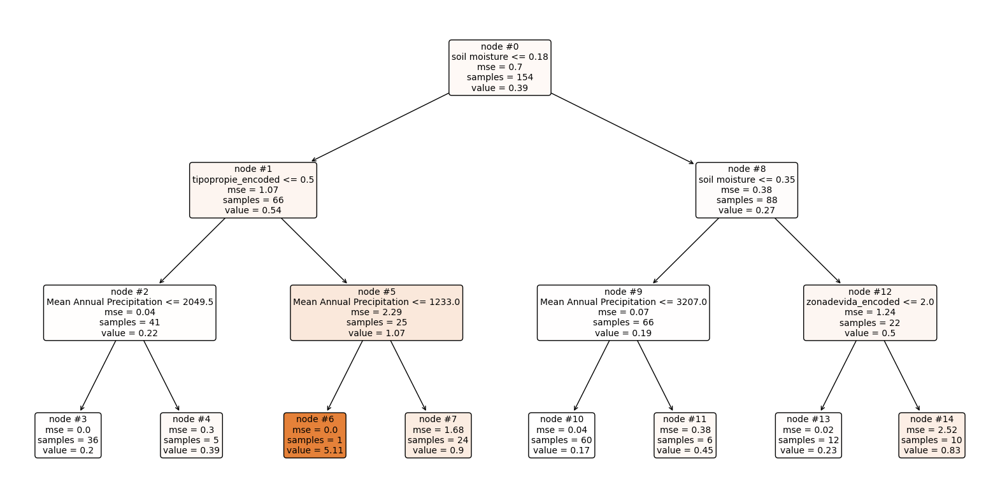

'decision_tree.pdf'

In [245]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
import matplotlib.pyplot as plt
df= pd.read_csv("civ.csv")

df = df[["Mean Annual Precipitation", "soil moisture", "tipopropie_encoded", "zonadevida_encoded", "k1"]]

X = df.drop(columns='k1')  

y = df['k1']

tree = DecisionTreeRegressor(max_depth=3)
tree.fit(X, y)

plt.figure(figsize=(20, 10))
plot_tree(tree, 
          feature_names=X.columns, 
          filled=True, 
          rounded=True, 
          precision=2,
          fontsize=10,
          proportion=False,
          node_ids=True)
plt.show()


dot_data = export_graphviz(tree, feature_names=X.columns, filled=True, rounded=True, out_file=None)

graph = graphviz.Source(dot_data)
graph.view(filename="decision_tree", cleanup=True)


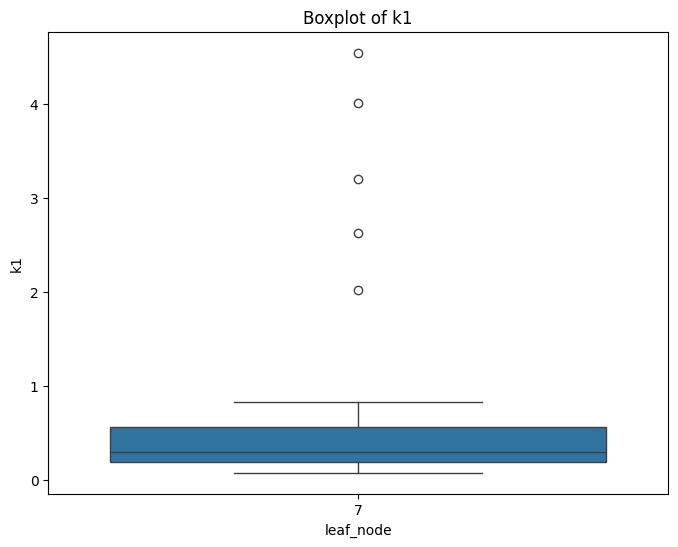

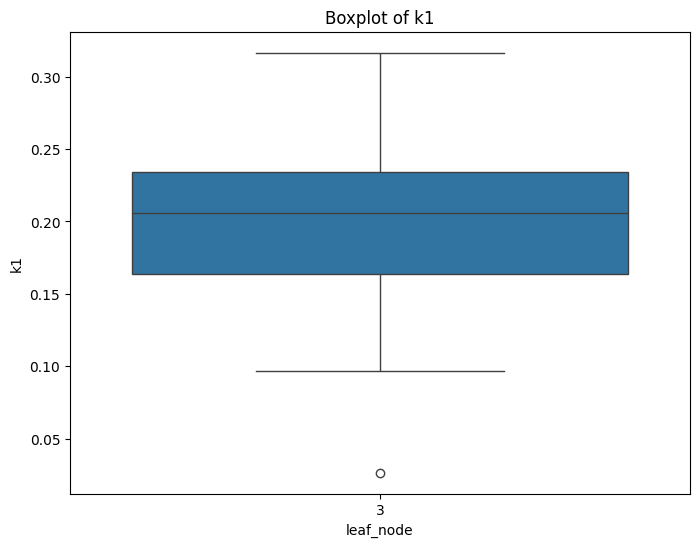

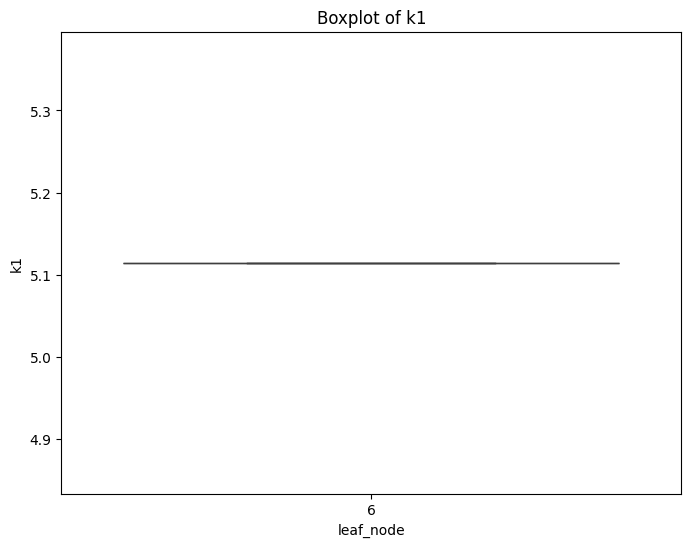

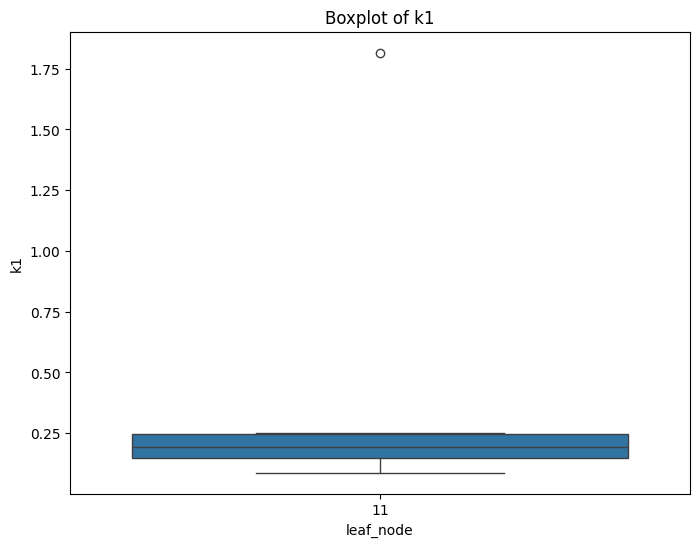

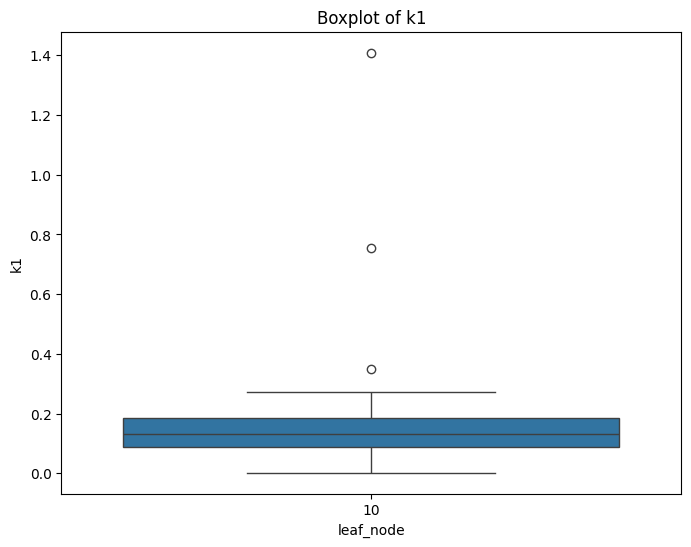

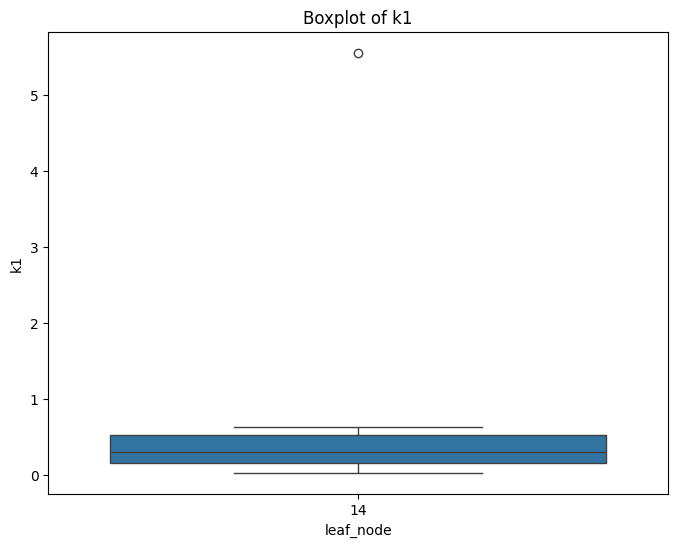

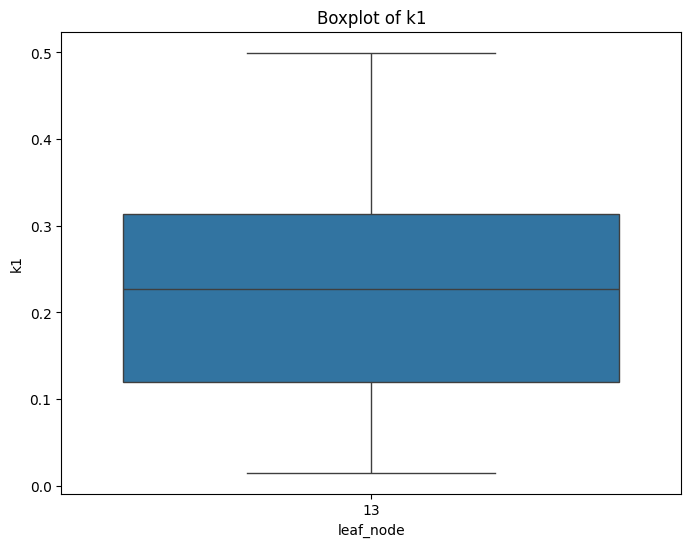

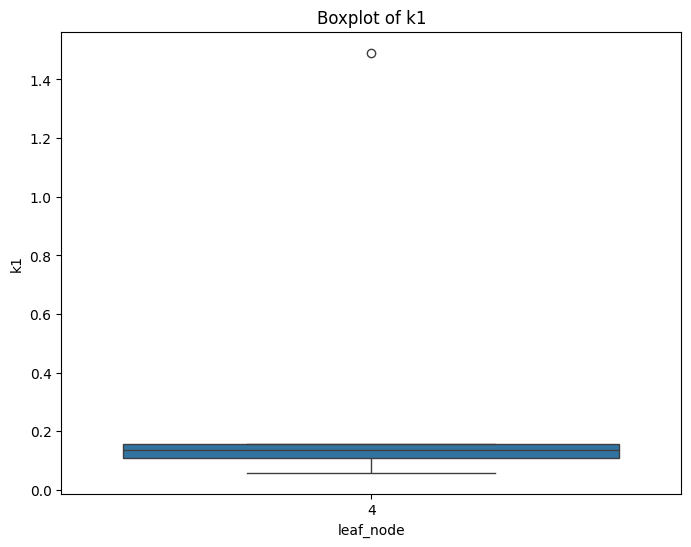

In [250]:
import matplotlib.pyplot as plt
import seaborn as sns

unique_leaf_nodes = df['leaf_node'].unique()

for node in unique_leaf_nodes:
    subset = df[df['leaf_node'] == node]
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='leaf_node', y='k1', data=subset)
    plt.title(f'Boxplot of k1')
    plt.savefig(f'Boxplot of k1 for leaf node {node}.png')
    plt.show()



In [5]:
import pandas as pd
from tabulate import tabulate
df= pd.read_csv("presentation.csv")
df['Especie'].unique().shape

(38,)